# SAM Analysis
Designed to calculate and plot the SAM. Link to [Data analysis](#Data-Analysis).

#### Choices for data

In [ ]:
#Experiment data for analysis
dataVariableId = 'psl'
dataSourceId = "UKESM1-0-LL"
experimentId = "historical"
tableId = "Amon"
approvedIds = ["r1i1p1f2", "r2i1p1f2", "r3i1p1f2"] #insert start of approved member_ids

#External data files
externalSAMFileName = "SAMIndex.txt"
GMModelNames = ["GMM_UK_2Class_R1", "GMM_UK_2Class_R2", "GMM_UK_2Class_R3"]#, "GMM_UK_2Class_R3_v2"]

#Custom Variables
latSel = slice(-89.5,-29.5) #Selected latitude to be investigated
maskName = "OceanMaskVolcello"

<br>

#### Imports

In [2]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import dask.dataframe as dd
import fsspec
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import zarr

from dask import delayed
from matplotlib.dates import DateFormatter
from matplotlib.pyplot import cm
from scipy import signal
from scipy import stats
print("Imports complete")

Imports complete


<br>

#### Data loading
<b>Loading the ESM Pressure data</b>

In [3]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
dfFilt = df[df.variable_id.eq(dataVariableId) & df.source_id.eq(dataSourceId) & df.table_id.eq(tableId) & df.experiment_id.eq(experimentId)]

memberArr = np.empty(shape=(0), dtype=bool)
for i in dfFilt["member_id"]:
    rowSel = i[:] in approvedIds #adapt i[:] to match size of approvedIds
    memberArr = np.append(memberArr, rowSel)

memberSer = pd.Series(memberArr, name='bools')
dfFilt = dfFilt[memberSer.values]

fileSetList = []
for i in range(len(dfFilt)):
    zstore = dfFilt.zstore.values[i]
    mapper = fsspec.get_mapper(zstore)
    fileRaw = xr.open_zarr(mapper, consolidated=True)
    fileSetList.append(fileRaw)
fileCount = len(fileSetList)
if fileCount:
    print(str(fileCount)+" "+dataSourceId+" data sets opened")
else:
    print("No ESM3 data sets opened")
    
for i in range(fileCount): #Formatting dates into np.datetime64 format
    startDateIterate = np.datetime64(fileSetList[i]['time'].values[0],'M')
    endDateIterate = np.datetime64(fileSetList[i]['time'].values[-1],'M') + np.timedelta64(1,'M')
    fileSetList[i]['time']=('time', np.arange(startDateIterate, endDateIterate, dtype='datetime64[M]'))
    fileSetList[i]['time_bnds']=('time_bnds', np.arange(startDateIterate, endDateIterate, dtype='datetime64[M]')) 
fileSet = xr.combine_nested(fileSetList, concat_dim='RunId') #Combining data sets
print("Data sets successfully merged")

dfESMLat = fileSet.psl.sel(lat=latSel) #Selection of latitude
dfESMLat = dfESMLat.reset_coords(drop=True) #Removes lev if single value

globalStartDate = dfESMLat["time"][0].values
globalDateInc = dfESMLat["time"][1].values - globalStartDate
globalEndDateIn = dfESMLat["time"][-1].values
globalEndDateOut = globalEndDateIn + globalDateInc

globalStartDateStr = str(globalStartDate)[:7]
globalEndDateInStr = str(globalEndDateIn)[:7]
globalEndDateOutStr = str(globalEndDateOut)[:7]

print("UKESM data sucessfully loaded.")

3 UKESM1-0-LL data sets opened
Data sets successfully merged
UKESM data sucessfully loaded.


<br>
<b>Loading the ocean mask</b>

In [4]:
maskFile = xr.open_dataset(maskName)
oceanMask = maskFile.to_array()
print("Mask Loaded into oceanMask")

Mask Loaded into oceanMask


<br>
<b>Unpacking ocean masks</b>

In [5]:
#Mask unpacking cell
geoRange = oceanMask #copying mask
geoRange = geoRange.rename({"variable":"cleanMe"}) #Dimension removal
geoRange = geoRange.sel(cleanMe = geoRange.cleanMe.values[0]) #Dimension removal
geoRange = geoRange.reset_coords("cleanMe", drop=True) #Dimension removal
geoRangeS = geoRange.stack(ij =("i", "j")) #Stacking
geoRangeFilt = geoRangeS.dropna("ij")
print("Ocean mask unpacked into geoRangeFilt.")

Ocean mask unpacked into geoRangeFilt.


<br>
<b>Loading external SAM Index</b>

In [6]:
externalSAMIndex = np.loadtxt("SAMIndex.txt", skiprows=1, max_rows=64)
externalSAMIndexYear = np.transpose(externalSAMIndex)[0]
externalSAMIndexSort = np.empty(shape=(0,2))
for i in range(len(externalSAMIndexYear)):
    for j in range(1,13):
        externalSAMIndexSort = np.append(externalSAMIndexSort, [[np.datetime64(str(int(externalSAMIndexYear[i]))+"-"+f"{j:02d}", "M"), externalSAMIndex[i][j]]], axis=0)
externalSAMIndexSort = np.transpose(externalSAMIndexSort)
print("External SAM index data in "+externalSAMFileName+" loaded into externalSAMIndexSort.")

External SAM index data in SAMIndex.txt loaded into externalSAMIndexSort.


<br>
<b>Loading mean latitudes from GMM</b>

In [7]:
thresholds = [0.25, 0.5, 0.75, 0.85]
LatMeanList = []
for i in GMModelNames:
    importName = i + "_LatMeans.npy"
    LatMeanList.append(np.load(importName))
print("GMM mean latitudes imported into LatMeanList.")

GMM mean latitudes imported into LatMeanList.


<br>

#### SAM pressure calculations

In [8]:
if True:
    normalisationData = dfESMLat.sel(time=slice('1971-01','2000-12'))
    normalisationDataP40 = normalisationData.sel(lat=-40, method="nearest")
    selLat40 = normalisationDataP40["lat"].values
    normalisationDataP65 = normalisationData.sel(lat=-65, method="nearest")
    selLat65 = normalisationDataP65["lat"].values

    normalisationDataP40MLon = normalisationDataP40.mean(["lon"], keep_attrs=True)
    normalisationDataP65MLon = normalisationDataP65.mean(["lon"], keep_attrs=True)
    normalisationDataP40MLonG = normalisationDataP40MLon.groupby("time.month")
    normalisationDataP65MLonG = normalisationDataP65MLon.groupby("time.month")
    P40m = normalisationDataP40MLonG.mean(["time"], keep_attrs=True).values
    P65m = normalisationDataP65MLonG.mean(["time"], keep_attrs=True).values

    normalisationDataP40G = normalisationDataP40.groupby("time.month")
    P40std = normalisationDataP40MLonG.std(["time"], keep_attrs=True).values #
    normalisationDataP65G = normalisationDataP65.groupby("time.month")
    P65std = normalisationDataP65MLonG.std(["time"], keep_attrs=True).values #
else:
    normalisationData = dfESMLat.sel(time=slice('1971-01','2000-12'))
    normalisationDataP40 = normalisationData.sel(lat=slice(-41,-39))
    normalisationDataP40M = normalisationDataP40.mean("lat", keep_attrs=True)
    normalisationDataP65 = normalisationData.sel(lat=slice(-66,-64))
    normalisationDataP65M = normalisationDataP65.mean("lat", keep_attrs=True)

    normalisationDataP40MLon = normalisationDataP40M.mean(["lon"], keep_attrs=True)
    normalisationDataP65MLon = normalisationDataP65M.mean(["lon"], keep_attrs=True)
    normalisationDataP40MLonG = normalisationDataP40MLon.groupby("time.month")
    normalisationDataP65MLonG = normalisationDataP65MLon.groupby("time.month")
    P40m = normalisationDataP40MLonG.mean(["time"], keep_attrs=True).values
    P65m = normalisationDataP65MLonG.mean(["time"], keep_attrs=True).values

    normalisationDataP40G = normalisationDataP40.groupby("time.month")
    P40std = normalisationDataP40G.std(["lat","lon","time"], keep_attrs=True).values
    normalisationDataP65G = normalisationDataP65.groupby("time.month")
    P65std = normalisationDataP65G.std(["lat","lon","time"], keep_attrs=True).values
print("Normalisation data calculated.")

Normalisation data calculated.


<br>

#### Calculation Functions
<b>Functions:</b><br>
<ul>
<li>externalSAMSearch - returns externalSAMIndexSort between two dates.
<li>SAMCalculateRaw - returns a data array of the difference in pressures between lat -40 and lat -65 (tolerance ±1°) for an input data array, not normalised .
<li>SAMCalculateNorm - returns a data array of the difference in pressures between lat -40 and lat -65 (tolerance ±1°) for an input data array, normalised using second input data array.
</ul>

In [9]:
def butter_lowpass(data,cut,order=4,sample_freq=1) :
    nyq = 0.5*sample_freq
    pass_freq =1./cut/nyq
    sos=signal.butter(order, pass_freq, 'low', output='sos')
    filt=signal.sosfiltfilt(sos,data)
    return filt


def externalSAMSearch(startDate, endDate):
    '''Performs np searching across externalSAMIndexSort for start-end date data, returns 2 x n np.array containing [dates][data]'''
    x, startIndex = np.where(externalSAMIndexSort == np.datetime64(startDate, 'M'))
    x, endIndex = np.where(externalSAMIndexSort == np.datetime64(endDate, 'M'))
    dateArray = externalSAMIndexSort[0][startIndex[0] : endIndex[0] + 1]
    dataArray = externalSAMIndexSort[1][startIndex[0] : endIndex[0] + 1]
    externalSAMSearch = np.append([dateArray], [dataArray], axis=0)
    return externalSAMSearch


def SAMCalculateNorm(dataArray, runId):
    '''Calculates the SAM index using P40m, P65m, P40std and P65std. Returns SAM index np array.'''
    timeArray = dataArray["time"].values
    startTimeY = timeArray[0].astype('datetime64[Y]').astype(int) + 1970
    endTimeY = timeArray[-1].astype('datetime64[Y]').astype(int) + 1970
    startTimeM = timeArray[0].astype('datetime64[M]').astype(int) % 12 + 1
    endTimeM = timeArray[-1].astype('datetime64[M]').astype(int) % 12 + 1

    P40 = dataArray.sel(lat=slice(-41, -39))
    P65 = dataArray.sel(lat=slice(-66, -64))

    P40zArray = np.empty(shape=0)
    P65zArray = np.empty(shape=0)
    if startTimeM > 1: #Part start year z transform
        P40YearPartS = P40.sel(time = str(startTimeY))
        P40YearPartS = P40YearPartS.mean(dim=["lat", "lon"])
        P40YearPartS = P40YearPartS.reset_coords(drop=True)
        P40zYearPartS = ((P40YearPartS-P40m[startTimeM-1:])/P40std[startTimeM-1:]).values
        P40zArray = np.append(P40zArray, P40zYearPartS)

        P65YearPartS = P65.sel(time = str(startTimeY))
        P65YearPartS = P65YearPartS.mean(dim=["lat", "lon"])
        P65YearPartS = P65YearPartS.reset_coords(drop=True)
        P65zYearPartS = ((P65YearPartS-P65m[startTimeM-1:])/P65std[startTimeM-1:]).values
        P65zArray = np.append(P65zArray, P65zYearPartS)
        startTimeY += 1  

    P40zYearPartE = np.empty(0)
    P65zYearPartE = np.empty(0)
    if endTimeM < 12: #Part end year z transform
        P40YearPartE = P40.sel(time = str(endTimeY))
        P40YearPartE = P40YearPartE.mean(dim=["lat", "lon"])
        P40YearPartE = P40YearPartE.reset_coords(drop=True)
        P40zYearPartE = ((P40YearPartE-P40m[:endTimeM-12])/P40std[:endTimeM-12]).values

        P65YearPartE = P65.sel(time = str(endTimeY))
        P65YearPartE = P65YearPartE.mean(dim=["lat", "lon"])
        P65YearPartE = P65YearPartE.reset_coords(drop=True)
        P65zYearPartE = ((P65YearPartE-P65m[:endTimeM-12])/P65std[:endTimeM-12]).values
        endTimeY -= 1  

    if startTimeY <= endTimeY: #Full year z transform
        for i in range(startTimeY, endTimeY + 1):
            P40Year = P40.sel(time = str(i))
            P40Year = P40Year.mean(dim=["lat", "lon"])
            P40Year = P40Year.reset_coords(drop=True)
            P40zYear = ((P40Year-P40m[runId])/P40std[runId]).values
            P40zArray = np.append(P40zArray, P40zYear)

            P65Year = P65.sel(time = str(i))
            P65Year = P65Year.mean(dim=["lat", "lon"])
            P65Year = P65Year.reset_coords(drop=True)
            P65zYear = ((P65Year-P65m[runId])/P65std[runId]).values
            P65zArray = np.append(P65zArray, P65zYear)

    P40zArray = np.append(P40zArray, P40zYearPartE) #Appends End year
    P65zArray = np.append(P65zArray, P65zYearPartE) #Appends End year
    
    SAMArray = P40zArray - P65zArray
    SAMArray = np.round(SAMArray, 2)
    
    try:
        intRunId = runId.values
    except:
        intRunId = runId
    
    indexName = "SAM_Index_"+str(intRunId)
    exportSAMData = {"time":timeArray, indexName:SAMArray}
    exportSAMDF = pd.DataFrame(exportSAMData, columns=["time",indexName])
    return exportSAMDF

print("Calculation functions defined")

Calculation functions defined


<br>

#### Plotting Functions
<b>Functions:</b><br>
<ul>
<li> mapPlot - plots the Southern Ocean orthographic project of the input data set, with input title and figure number.
<li> timePlot -  plots the SAM index in the input data array over time.
<li> timePlotStd - plots the SAM index for a 12 month period (starting January) with error bars.
<li> timePlotYear - plots the SAM index for a 12 month period (starting January) without error bars. Compatible with timePlotStd.
<li> timePlotDecade - plots the SAM index for an input data array over a decade period. Start date is dispalyed as 2001-01.
</ul>

In [10]:
months = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
lineType = ["-.", "--", ":"]
timeAxis = np.arange(np.datetime64("1980-01"), np.datetime64("2010-01"), np.timedelta64(1, 'M'), dtype='datetime64[M]')

def latMeanPlot(dataArray, smoothFactor, labelIn, plotNo):
    plt.figure(plotNo, figsize=(20,10))
    if smoothFactor > 0:
        timeAxisTemp = timeAxis[smoothFactor:-smoothFactor]
        dataArray = dataArray[smoothFactor:-smoothFactor]
    else:
        timeAxisTemp = timeAxis
    plt.plot(timeAxisTemp, dataArray, label=labelIn)
    plt.gca().xaxis.set_major_locator(mdates.YearLocator(5))
    plt.gca().xaxis.set_minor_locator(mdates.YearLocator(1))
    plt.gca().xaxis.set_major_formatter(DateFormatter("%Y-%m"))
    plt.gca().set(xlim=[np.datetime64("1979-01", "Y"), np.datetime64("2011-01", "Y")])
    plt.xlabel("Date")
    plt.ylabel("Mean Latitude (°)")
    plt.legend()
    
    
def locationPlotXr(dataArray, size, plotNo):
    '''Plots locations of numpy arrays with date colour scheme'''
    plt.figure(plotNo, figsize=size)
    ax = plt.axes(projection=ccrs.SouthPolarStereo())
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.coastlines()
    ax.gridlines()
    im = ax.scatter(dataArray["lon"], dataArray["lat"], transform=ccrs.PlateCarree())
    plt.plot(np.arange(0,361,1),np.ones(361)*-29.5, transform=ccrs.PlateCarree(), color="Black")
    plt.title("Sample Locations ("+str(len(dataArray["lat"]))+")")        


def SAMLatPlot(plotNo):
    '''Plots SAM index latitudes on a map, requires selLat40 and selLat65'''
    plt.figure(plotNo, figsize=(7,7))
    ax = plt.axes(projection=ccrs.SouthPolarStereo())
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.coastlines()
    ax.gridlines()
    plt.plot(np.arange(0,361,1),np.ones(361)*selLat40, transform=ccrs.PlateCarree(), color="Black")
    plt.plot(np.arange(0,361,1),np.ones(361)*selLat65, transform=ccrs.PlateCarree(), color="Black")
    plt.title("Selected latitudes for SAM index calculation")    
    
    
def timePlot(dataArray, runId, label, title, plotNo):
    '''Displays SAM index over time for any given range.'''
    plt.figure(plotNo, figsize = (20,10))
    indexName = "SAM_Index_"+str(runId)
    plt.plot(dataArray["time"], dataArray[indexName],label = str(label))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.axhline(0, color="Black", lw=0.5)
    plt.legend(loc='upper right')
    plt.ylabel("SAM Index")
    plt.title(str(title))
    
    
def timePlotStd(dataSetMean, dataSetError, title, plotNo):
    '''Displays SAM index with standard deviations over a 12 month period.'''
    plt.figure(plotNo, figsize = (10,10))
    plt.errorbar(months, dataSetMean.values, yerr=dataSetError.values, label = dataSetMean.name, capsize=5)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlabel("Month")
    plt.ylabel("SAM Index")
    plt.title(str(title))
    
    
def timePlotYear(dataArray, title, plotNo):
    '''Displays SAM index for a 12 month period starting in January. Compatible with timePlotStd.'''
    plt.figure(plotNo, figsize = (10,10))
    plt.plot(months, dataArray.values, label = dataArray.name)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlabel("Month")
    plt.ylabel("SAM Index")
    plt.title(str(title))

def timePlotDecade(dataArray, runId, label, title, plotNo):
    '''Displays SAM index over a decade.'''
    timeAxis = np.arange(np.datetime64("2001-01"), np.datetime64("2011-01"), np.timedelta64(1, 'M'), dtype='datetime64[M]')
    indexName = "SAM_Index_"+str(runId)
    plt.figure(plotNo, figsize = (20,10))
    plt.plot(timeAxis, dataArray[indexName], label = str(label))
    plt.axhline(0, color="Black", lw=0.5)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.ylabel("SAM Index")
    plt.xlabel("Time")
    plt.title(str(title))
    
print("Plotting functions defined")

Plotting functions defined


<br>

#### Plotting the mask

Ocean Mask from Volcello Data


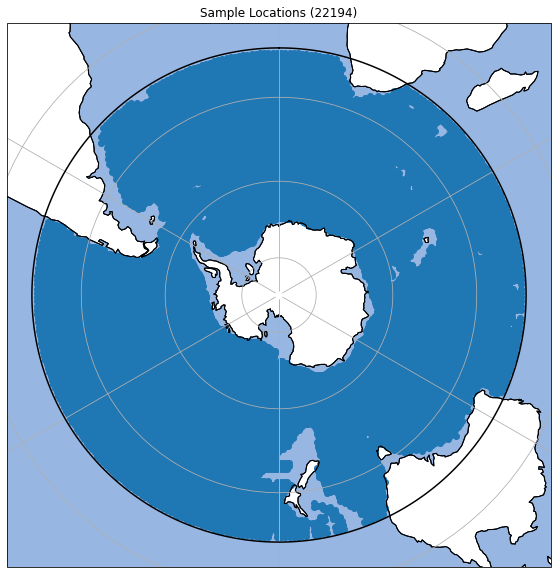

In [11]:
locationPlotXr(geoRangeFilt, (10,10), 1) #OceanMaskVolcello
print("Ocean Mask from Volcello Data")
plt.show()

<br>

#### Latitudes Visualised

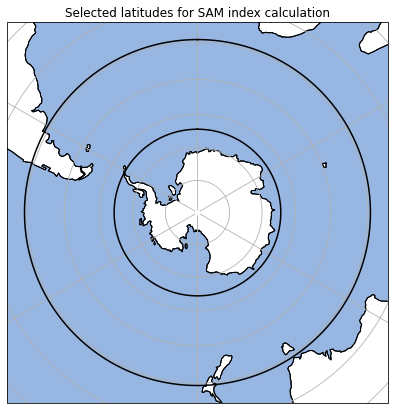

In [12]:
SAMLatPlot(1)
plt.show()

<br>

#### Data Analysis

<br>
<b>SAM trend for 1980 - 2009</b><br>

In [13]:
startDate, endDate = "1980-01","2009-12"
SAM1980_09DF = pd.DataFrame({'time' : dfESMLat.time.sel(time=slice(startDate, endDate)).values})

for i in dfESMLat["RunId"]:
    SAM1980_09Part_data = dfESMLat.sel(time=slice(startDate, endDate), RunId=i)
    SAM1980_09Part = SAMCalculateNorm(SAM1980_09Part_data, i)
    SAM1980_09DF = SAM1980_09DF.merge(SAM1980_09Part, left_on="time", right_on="time")

print("External and internal SAM calculated for "+startDate+" - "+endDate+".")

External and internal SAM calculated for 1980-01 - 2009-12.


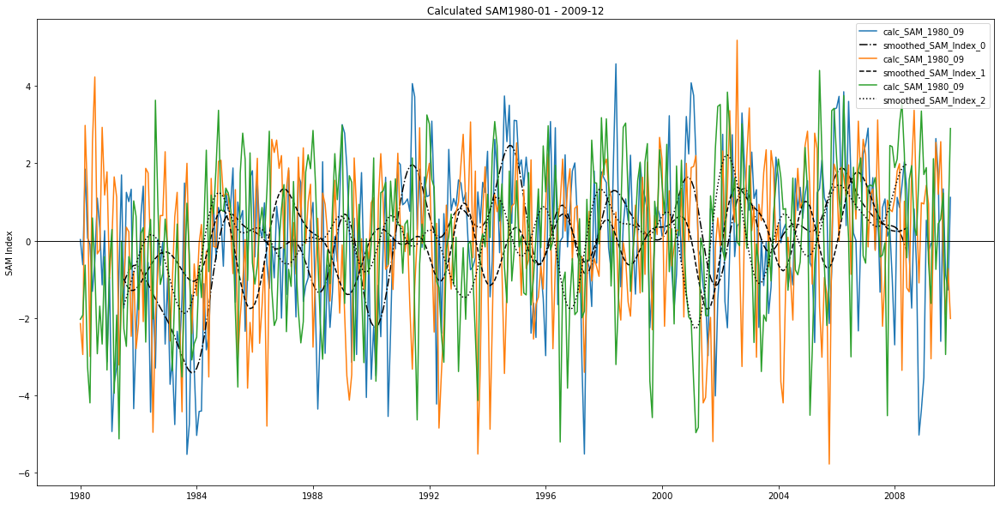

In [14]:
smooth18SAM1980_09Arr = np.empty(shape=(0,len(SAM1980_09DF["time"])))
for i in range(fileCount):
    indexName = "SAM_Index_"+str(i)
    smooth18SAM1980_09 = butter_lowpass(SAM1980_09DF[indexName], 18)
    smooth18SAM1980_09Arr = np.append(smooth18SAM1980_09Arr, [smooth18SAM1980_09], axis=0)
    
    timePlot(SAM1980_09DF, i, "calc_SAM_1980_09", "Calculated SAM"+startDate+" - "+endDate, 1)
    plt.plot(SAM1980_09DF["time"][18:-18], smooth18SAM1980_09Arr[i%3][18:-18], color="Black", ls=lineType[i], label="smoothed_"+indexName)
plt.axhline(0, color="Black", lw=0.5)
plt.legend()
plt.show()

<br>
<b>SAM smoothing</b>

In [15]:
startDate, endDate = "1980-01","2009-12"
extSAM1980_09 = externalSAMSearch(startDate, endDate)    
print("External SAM calculated for "+startDate+" - "+endDate+".")

External SAM calculated for 1980-01 - 2009-12.


In [16]:
smooth12SAM1980_09Arr = np.empty(shape=(0,len(SAM1980_09DF["time"])))
smooth18SAM1980_09Arr = np.empty(shape=(0,len(SAM1980_09DF["time"])))
smooth24SAM1980_09Arr = np.empty(shape=(0,len(SAM1980_09DF["time"])))
smooth120SAM1980_09Arr = np.empty(shape=(0,len(SAM1980_09DF["time"])))

smooth12extSAM1980_09 = butter_lowpass(extSAM1980_09[1], 12)
for i in range(fileCount):
    indexName = "SAM_Index_"+str(i)
    smooth12SAM1980_09 = butter_lowpass(SAM1980_09DF[indexName], 12)
    smooth12SAM1980_09Arr = np.append(smooth12SAM1980_09Arr, [smooth12SAM1980_09], axis=0)

smooth18extSAM1980_09 = butter_lowpass(extSAM1980_09[1], 18)
for i in range(fileCount):
    indexName = "SAM_Index_"+str(i)
    smooth18SAM1980_09 = butter_lowpass(SAM1980_09DF[indexName], 18)
    smooth18SAM1980_09Arr = np.append(smooth18SAM1980_09Arr, [smooth18SAM1980_09], axis=0)


smooth24extSAM1980_09 = butter_lowpass(extSAM1980_09[1], 24)
for i in range(fileCount):
    indexName = "SAM_Index_"+str(i)
    smooth24SAM1980_09 = butter_lowpass(SAM1980_09DF[indexName], 24)
    smooth24SAM1980_09Arr = np.append(smooth24SAM1980_09Arr, [smooth24SAM1980_09], axis=0)
    
print("Smoothing calculated for SAM Index.")

Smoothing calculated for SAM Index.


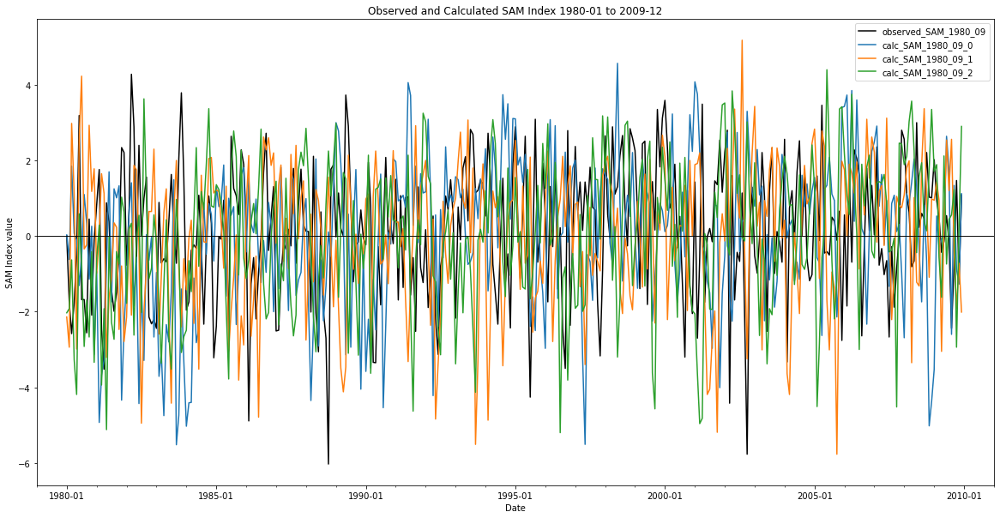

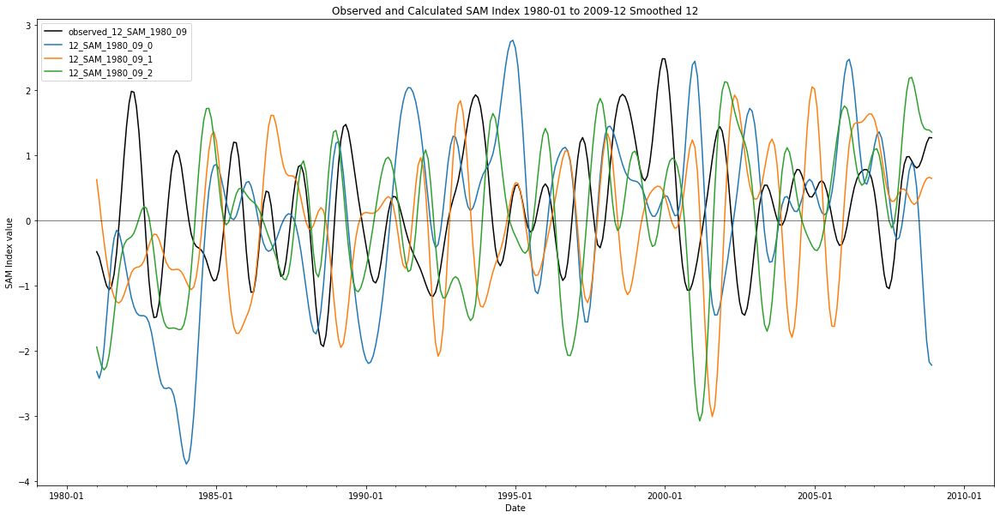

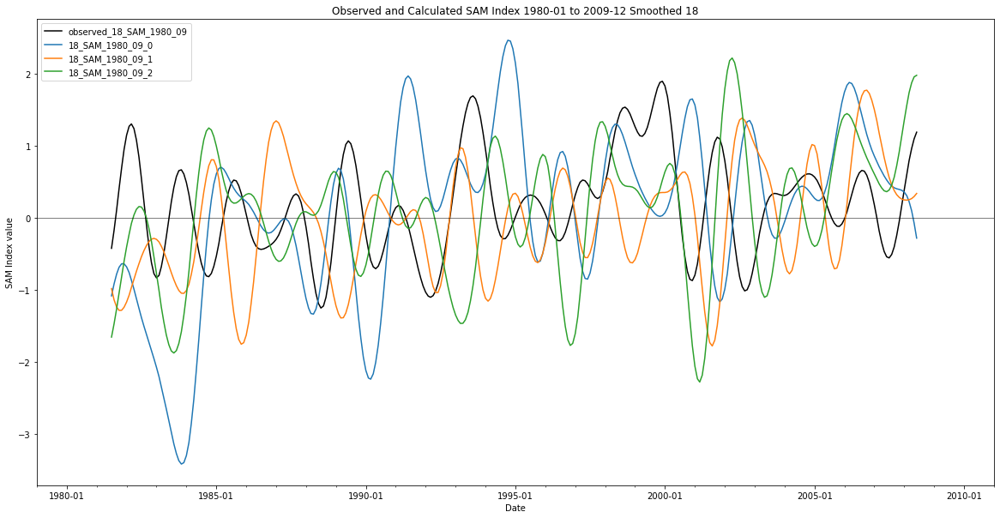

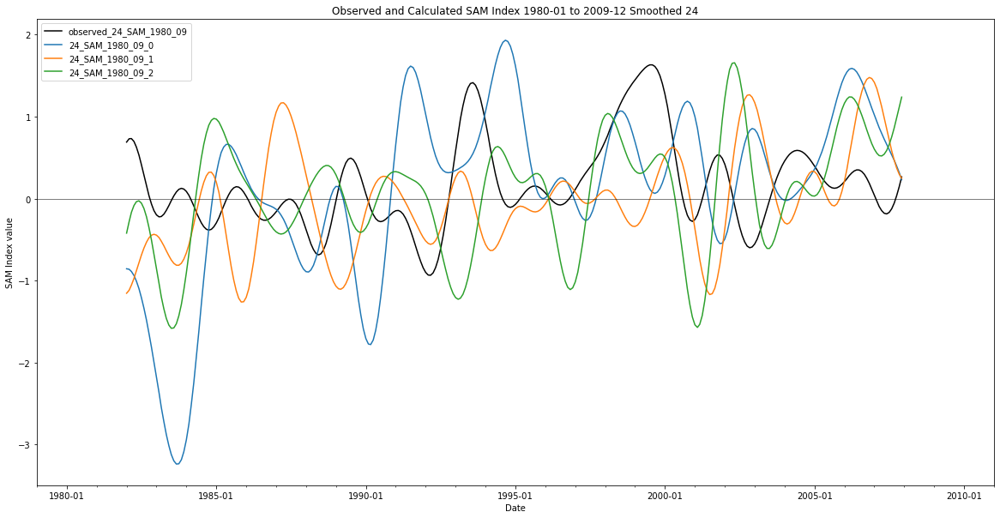

In [17]:
xlimStart, xLimStop = np.datetime64("1979-01", "Y"), np.datetime64("2011-01", "Y")

plt.figure(1, figsize=(20,10))
plt.plot(extSAM1980_09[0], extSAM1980_09[1], label="observed_SAM_1980_09", color="Black")
#plt.plot(SAM1980_09DF["time"], smooth18extSAM1980_09, color="Black", label="observed_18_SAM_1980_09")
for i in range(fileCount):
    timePlot(SAM1980_09DF, i, "calc_SAM_1980_09_"+str(i), "Calculated vs External SAM "+startDate+" - "+endDate, 1)
    #plt.plot(SAM1980_09DF["time"], smooth18SAM1980_09Arr[i], color="Black", ls=lineType[i%3], label="18_SAM_1980_09_"+str(i))
plt.gca().xaxis.set_major_locator(mdates.YearLocator(5))
plt.gca().xaxis.set_minor_locator(mdates.YearLocator(1))
plt.gca().xaxis.set_major_formatter(DateFormatter("%Y-%m"))
plt.gca().set(xlim=[xlimStart, xLimStop])
plt.axhline(0, color="Black", lw=0.5)
plt.xlabel("Date")
plt.ylabel("SAM Index value")
plt.title("Observed and Calculated SAM Index 1980-01 to 2009-12")
plt.legend()

plt.figure(2, figsize=(20,10))
plt.plot(SAM1980_09DF["time"][12:-12], smooth12extSAM1980_09[12:-12], color="Black", label="observed_12_SAM_1980_09")
for i in range(fileCount):
    plt.plot(SAM1980_09DF["time"][12:-12], smooth12SAM1980_09Arr[i][12:-12], label="12_SAM_1980_09_"+str(i))
plt.gca().xaxis.set_major_locator(mdates.YearLocator(5))
plt.gca().xaxis.set_minor_locator(mdates.YearLocator(1))
plt.gca().xaxis.set_major_formatter(DateFormatter("%Y-%m"))
plt.gca().set(xlim=[xlimStart, xLimStop])
plt.axhline(0, color="Black", lw=0.5)
plt.xlabel("Date")
plt.ylabel("SAM Index value")
plt.title("Observed and Calculated SAM Index 1980-01 to 2009-12 Smoothed 12")
plt.legend()

plt.figure(3, figsize=(20,10))
plt.plot(SAM1980_09DF["time"][18:-18], smooth18extSAM1980_09[18:-18], color="Black", label="observed_18_SAM_1980_09")
for i in range(fileCount):
    plt.plot(SAM1980_09DF["time"][18:-18], smooth18SAM1980_09Arr[i][18:-18], label="18_SAM_1980_09_"+str(i))
plt.gca().xaxis.set_major_locator(mdates.YearLocator(5))
plt.gca().xaxis.set_minor_locator(mdates.YearLocator(1))
plt.gca().xaxis.set_major_formatter(DateFormatter("%Y-%m"))
plt.gca().set(xlim=[np.datetime64("1979-01", "Y"), np.datetime64("2011-01", "Y")])
plt.axhline(0, color="Black", lw=0.5)
plt.xlabel("Date")
plt.ylabel("SAM Index value")
plt.title("Observed and Calculated SAM Index 1980-01 to 2009-12 Smoothed 18")
plt.legend()

plt.figure(4, figsize=(20,10))
plt.plot(SAM1980_09DF["time"][24:-24], smooth24extSAM1980_09[24:-24], color="Black", label="observed_24_SAM_1980_09")
for i in range(fileCount):
    plt.plot(SAM1980_09DF["time"][24:-24], smooth24SAM1980_09Arr[i][24:-24], label="24_SAM_1980_09_"+str(i))
plt.gca().xaxis.set_major_locator(mdates.YearLocator(5))
plt.gca().xaxis.set_minor_locator(mdates.YearLocator(1))
plt.gca().xaxis.set_major_formatter(DateFormatter("%Y-%m"))
plt.gca().set(xlim=[xlimStart, xLimStop])
plt.axhline(0, color="Black", lw=0.5)
plt.xlabel("Date")
plt.ylabel("SAM Index value")
plt.title("Observed and Calculated SAM Index 1980-01 to 2009-12 Smoothed 24")
plt.legend()

plt.show()

<br>
<b>Monthly Averages</b>

In [18]:
thresholds = ["0.25", "0.5", "0.75", "0.85"]
meanLatDFList = []
meanLatDFMonthlyMeanList = []
meanLatDFMonthlyStdList = []
for i in range(len(GMModelNames)):
    meanLatData = LatMeanList[i].squeeze().T
    meanLatDF = pd.DataFrame(meanLatData, columns=thresholds)
    meanLatDF.index = pd.to_datetime(np.arange(np.datetime64("1980-01"), np.datetime64("2010-01"), np.timedelta64(1, 'M'), dtype='datetime64[M]'))
    meanLatDFG = meanLatDF.groupby(by=meanLatDF.index.month)
    meanLatDFMonthlyMean = meanLatDFG.mean()
    meanLatDFMonthlyStd = meanLatDFG.std()
    meanLatDFList.append(meanLatDF)
    meanLatDFMonthlyMeanList.append(meanLatDFMonthlyMean)
    meanLatDFMonthlyStdList.append(meanLatDFMonthlyStd)
print("Monthly Means and Standard Deviations Calculated for all runs, stored in meanLatDFMonthlyMeanList and meanLatDFMonthlyStdList")

Monthly Means and Standard Deviations Calculated for all runs, stored in meanLatDFMonthlyMeanList and meanLatDFMonthlyStdList


In [19]:
npAMeanLatDFMonthlyMeanListList = []
for i in range(len(GMModelNames)):
    npAMeanLatDFMonthlyMeanList = np.empty(shape=(0,360))
    for j in range(4):
        npSMeanLatDFMonthlyMean = np.array(meanLatDFMonthlyMeanList[i][thresholds[j]]) #Converting mean xarray into np for fast replication
        npAMeanLatDFMonthlyMean = np.append(npSMeanLatDFMonthlyMean, npSMeanLatDFMonthlyMean)
        for k in range(28):
            npAMeanLatDFMonthlyMean = np.append(npAMeanLatDFMonthlyMean, npSMeanLatDFMonthlyMean)
        npAMeanLatDFMonthlyMeanList = np.append(npAMeanLatDFMonthlyMeanList, [npAMeanLatDFMonthlyMean], axis=0)

    for j in range(4):
        columnName = meanLatDF.columns[j]+"_Anom"
        meanLatDFList[i][columnName] = meanLatDFList[i][thresholds[j]] - npAMeanLatDFMonthlyMeanList[j]
        
      
    npAMeanLatDFMonthlyMeanListList.append(npAMeanLatDFMonthlyMeanList)

print("Extended Monthly Means calculated for all thresholds, stored in npAMeanLatDFMonthlyMeanListList.")
print("Anomalies calculated for all thresholds and stored in meanLatDFList.")

Extended Monthly Means calculated for all thresholds, stored in npAMeanLatDFMonthlyMeanListList.
Anomalies calculated for all thresholds and stored in meanLatDFList.


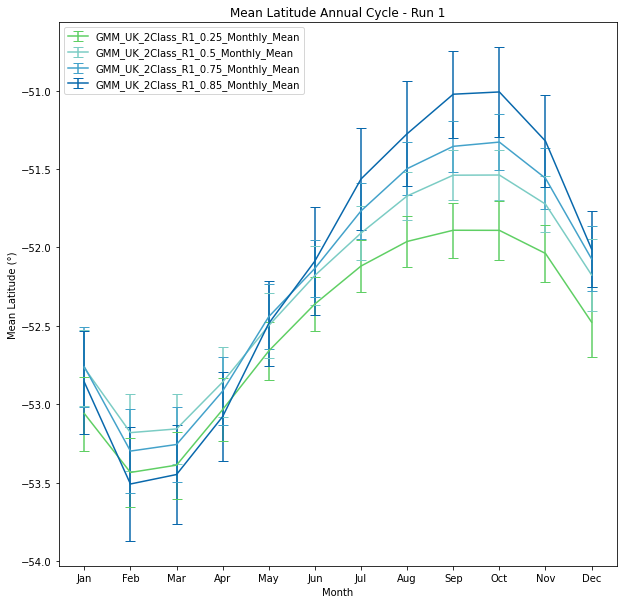

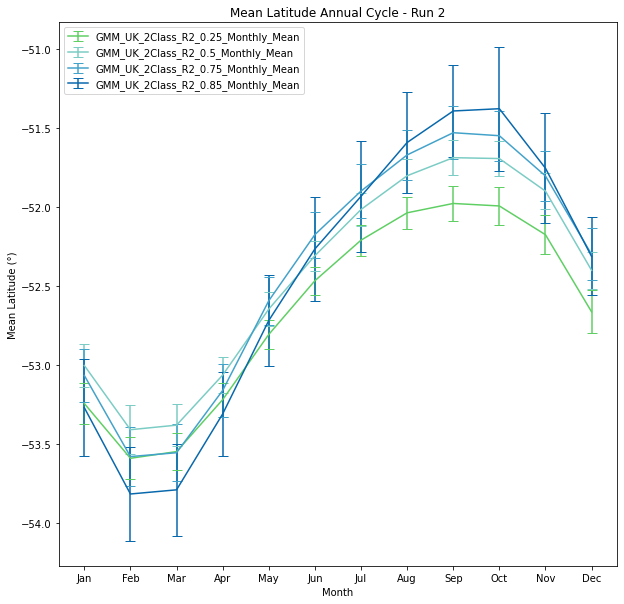

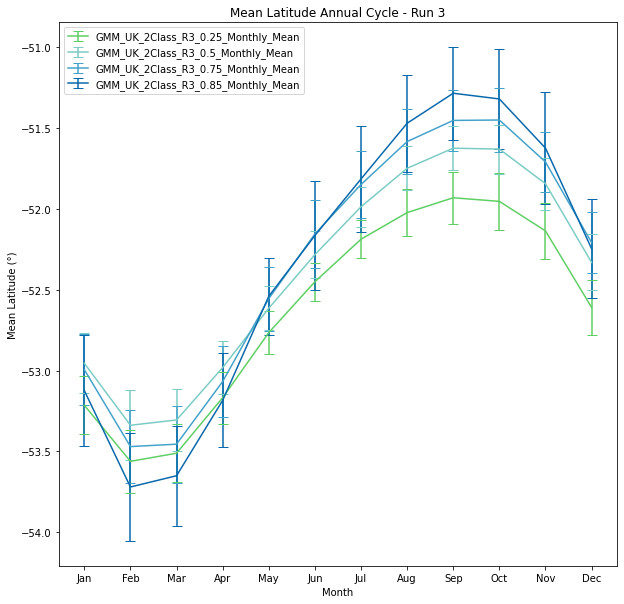

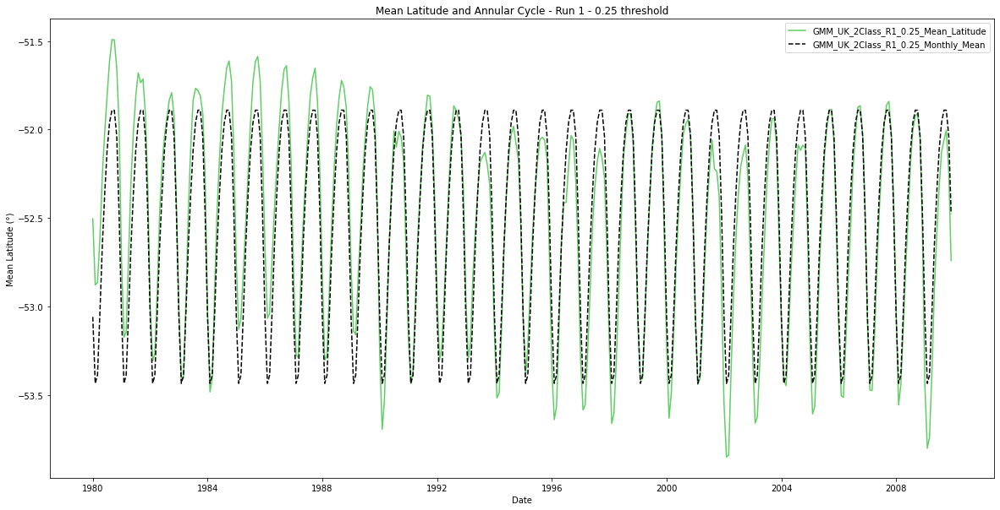

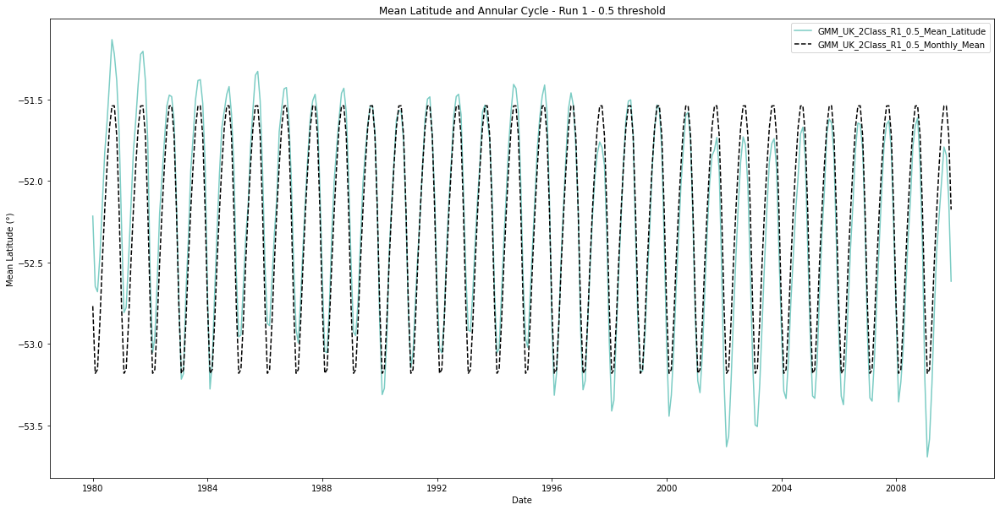

...

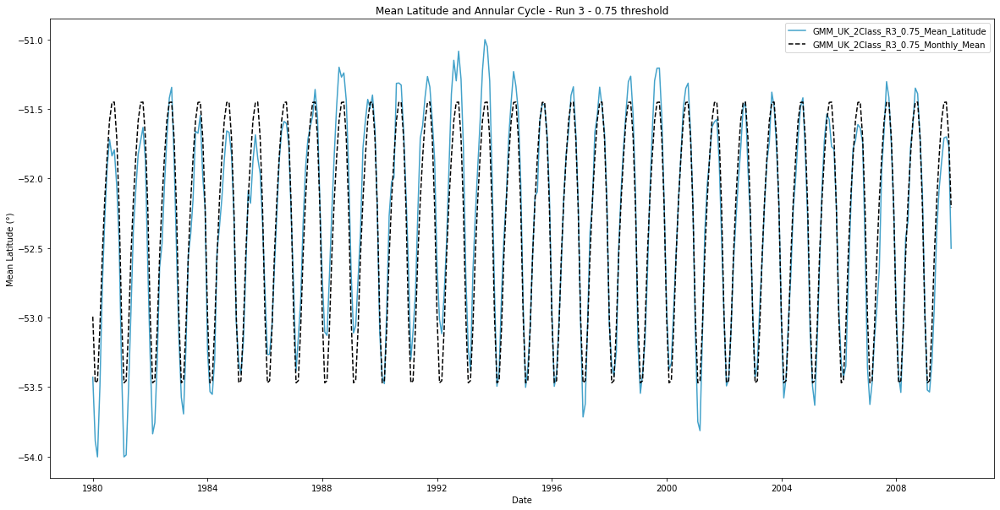

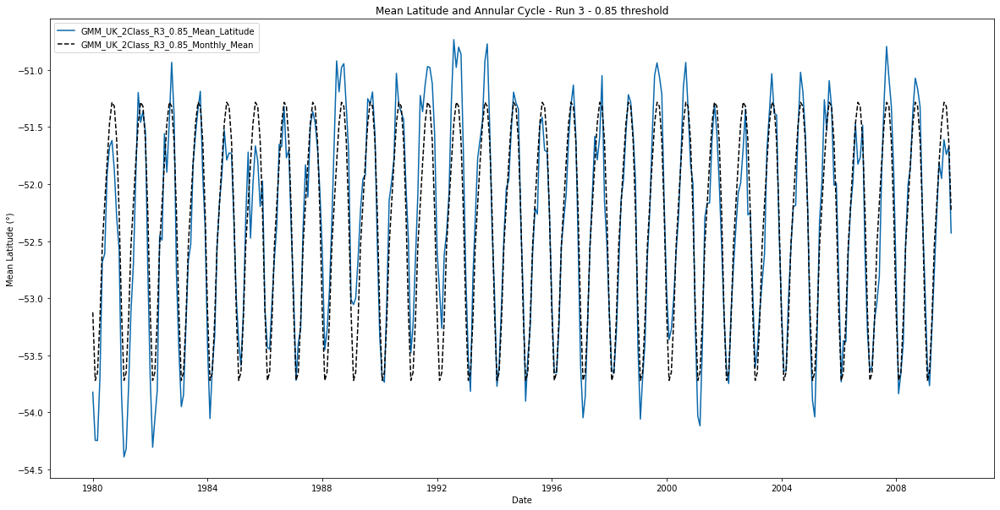

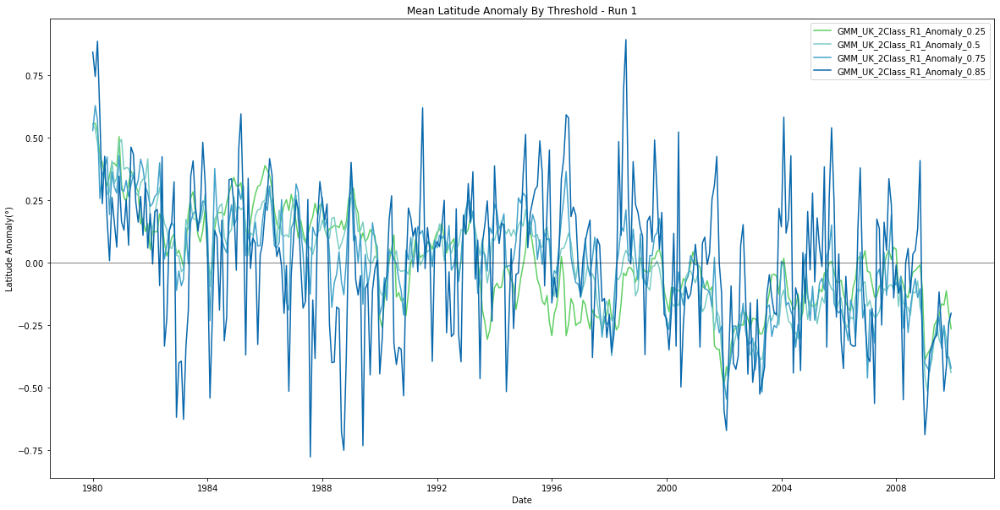

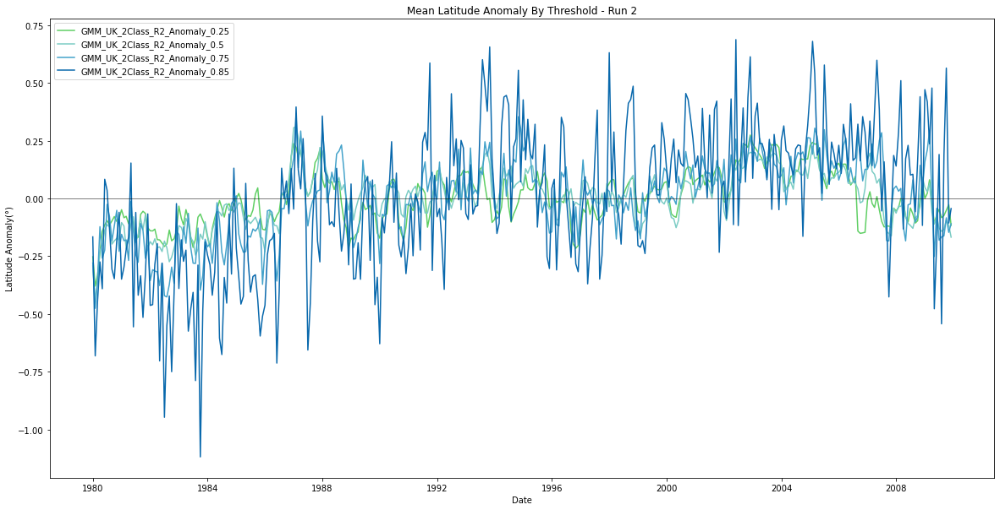

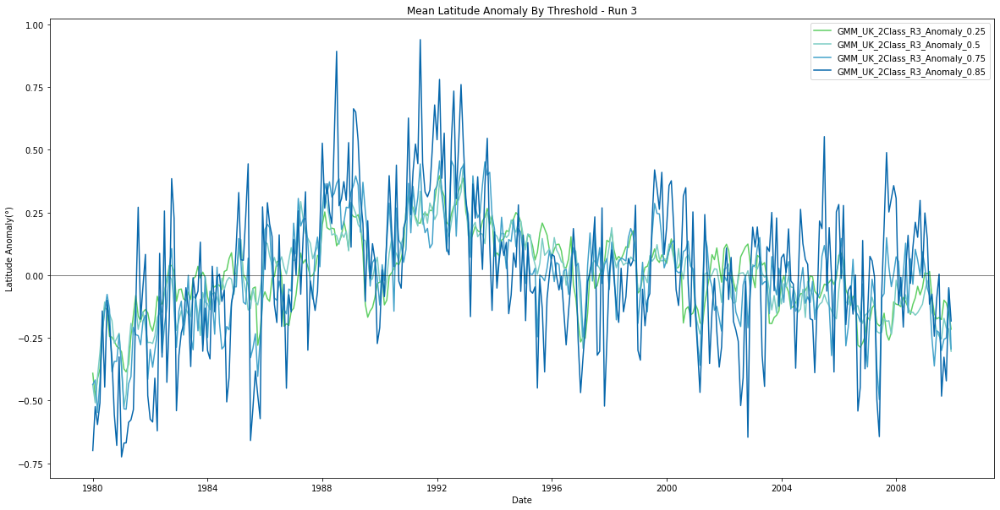

In [20]:
threshColor = ["#5fcf64", "#7bccc4", "#43a2ca", "#0868ac"]
for i in range(len(GMModelNames)):
    plt.figure(i, figsize = (10,10))
    for j in range(4):
        plt.errorbar(months, meanLatDFMonthlyMeanList[i][thresholds[j]], yerr=meanLatDFMonthlyStdList[i][thresholds[j]], label = str(GMModelNames[i])+"_"+str(thresholds[j])+"_Monthly_Mean", capsize=5, color=threshColor[j])
    plt.xlabel("Month")
    plt.ylabel("Mean Latitude (°)")
    plt.title("Mean Latitude Annual Cycle - Run "+str(i+1))
    plt.legend()
    plt.show()

for i in range(len(GMModelNames)):
    for j in range(4):
        plt.figure((i+1)*4+j, figsize = (20,10))
        plt.plot(timeAxis, meanLatDFList[i][thresholds[j]], label=str(GMModelNames[i])+"_"+str(thresholds[j])+"_Mean_Latitude", color=threshColor[j])
        plt.plot(timeAxis, npAMeanLatDFMonthlyMeanListList[i][j], label=str(GMModelNames[i])+"_"+str(thresholds[j])+"_Monthly_Mean", color="Black", ls="--")
        plt.xlabel("Date")
        plt.ylabel("Mean Latitude (°)")
        plt.title("Mean Latitude and Annular Cycle - Run "+str(i+1)+" - "+str(thresholds[j])+" threshold")
        plt.legend()
        plt.show()

for i in range(len(GMModelNames)):
    plt.figure(16+i, figsize = (20,10))
    for j in range(4):
        plt.plot(timeAxis, meanLatDFList[i][thresholds[j]+"_Anom"], label=str(GMModelNames[i])+"_Anomaly_"+str(thresholds[j]), color=threshColor[j])
    plt.axhline(0, color="Black", lw=0.5)
    plt.xlabel("Date")
    plt.ylabel("Latitude Anomaly(°)")
    plt.title("Mean Latitude Anomaly By Threshold - Run "+str(i+1))
    plt.legend()
    plt.show()

<br>
<b>Mean Latitude Data</b>

In [21]:
smoothLatArrLen = len(LatMeanList[0][0])
smooth18Lat1980_09Arr = np.empty(shape=(0, 4, smoothLatArrLen))
smooth24Lat1980_09Arr = np.empty(shape=(0, 4, smoothLatArrLen))
smooth50Lat1980_09Arr = np.empty(shape=(0, 4, smoothLatArrLen))

for i in range(len(GMModelNames)):
    currentLatMeans = LatMeanList[i]
    smooth18TempArr = np.empty(shape=(0,smoothLatArrLen))
    smooth24TempArr = np.empty(shape=(0,smoothLatArrLen))
    smooth50TempArr = np.empty(shape=(0,smoothLatArrLen))
    for j in range(len(thresholds)):
        currentLatMeanSingle = currentLatMeans[j].squeeze()
        smooth18TempArr = np.append(smooth18TempArr, [butter_lowpass(currentLatMeanSingle, 18)], axis=0)
        smooth24TempArr = np.append(smooth24TempArr, [butter_lowpass(currentLatMeanSingle, 24)], axis=0)
        smooth50TempArr = np.append(smooth50TempArr, [butter_lowpass(currentLatMeanSingle, 50)], axis=0)
        
    smooth18Lat1980_09Arr = np.append(smooth18Lat1980_09Arr, [smooth18TempArr], axis=0)
    smooth24Lat1980_09Arr = np.append(smooth24Lat1980_09Arr, [smooth24TempArr], axis=0)
    smooth50Lat1980_09Arr = np.append(smooth50Lat1980_09Arr, [smooth50TempArr], axis=0) 
print("Smoothing calculated for SAM Index.")

Smoothing calculated for SAM Index.


In [22]:
thresholdsLen = len(thresholds)
currSmooth18MeanArr = np.empty(shape=(0, smoothLatArrLen))
currSmooth24MeanArr = np.empty(shape=(0, smoothLatArrLen))
currSmooth50MeanArr = np.empty(shape=(0, smoothLatArrLen))

for i in range(thresholdsLen):
    currSmooth18Mean = np.mean(smooth18Lat1980_09Arr[:,i], axis=0)
    currSmooth24Mean = np.mean(smooth24Lat1980_09Arr[:,i], axis=0)
    currSmooth50Mean = np.mean(smooth50Lat1980_09Arr[:,i], axis=0)
    
    currSmooth18MeanArr = np.append(currSmooth18MeanArr, [currSmooth18Mean], axis=0)
    currSmooth24MeanArr = np.append(currSmooth24MeanArr, [currSmooth24Mean], axis=0)
    currSmooth50MeanArr = np.append(currSmooth50MeanArr, [currSmooth50Mean], axis=0)
    
print("Smoothing Averages calculated.")

Smoothing Averages calculated.


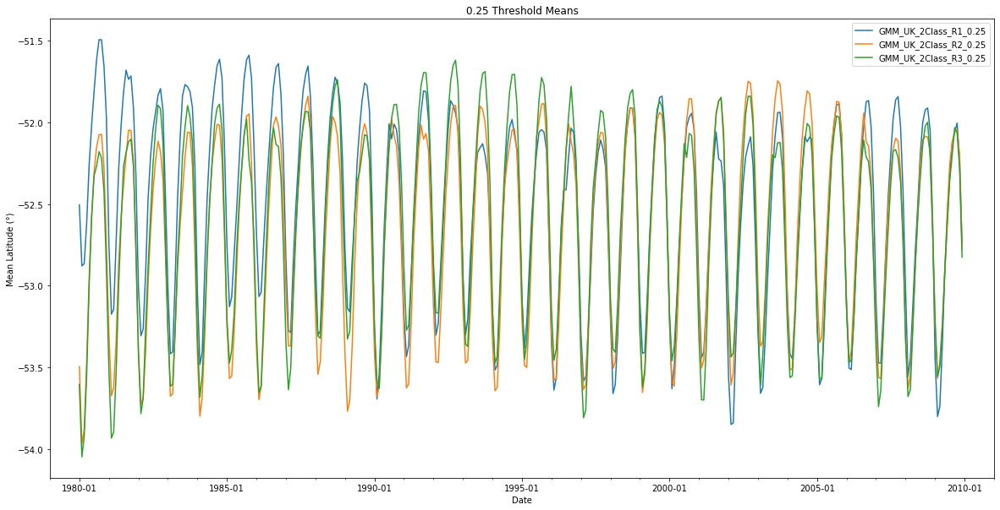

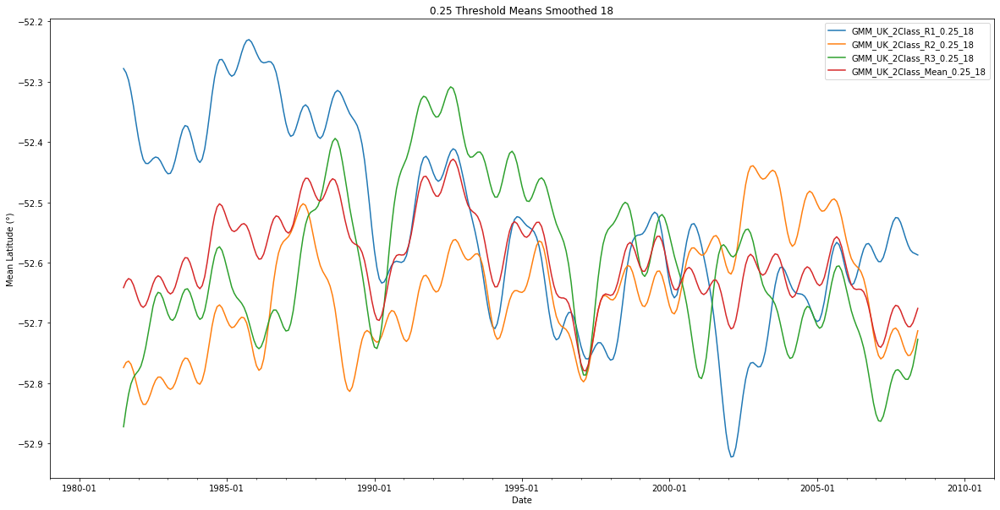

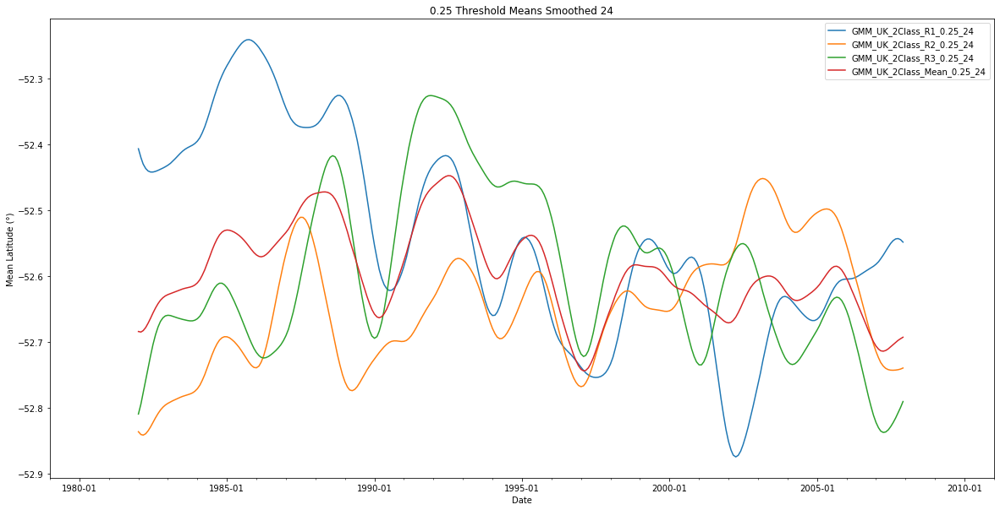

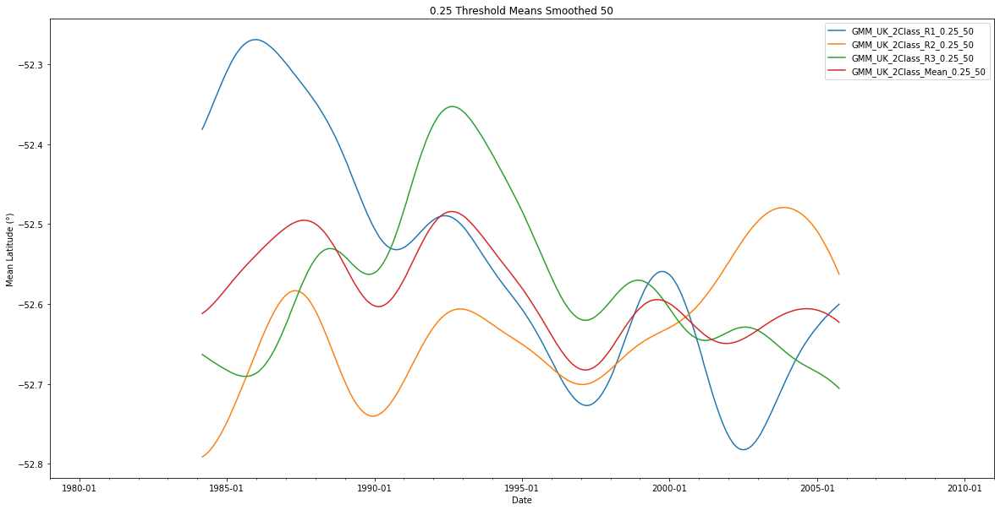

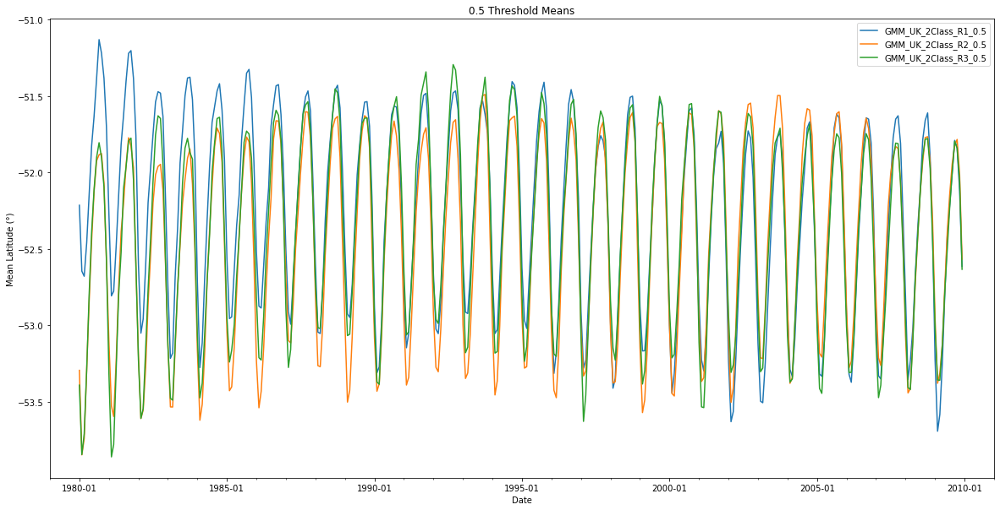

...

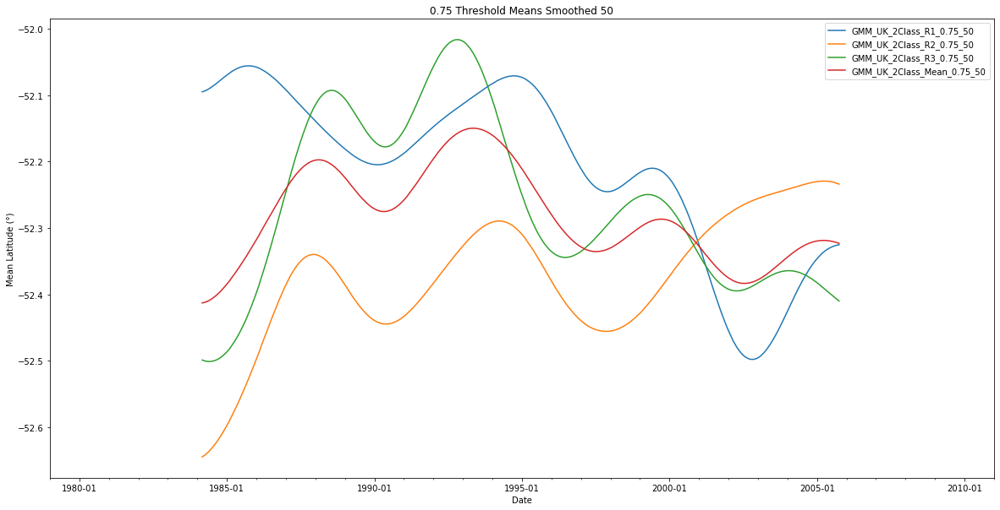

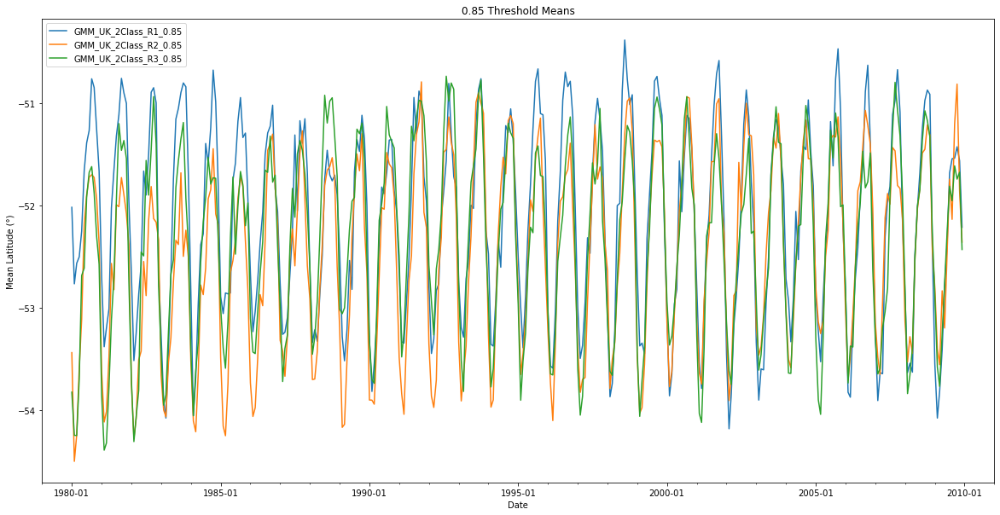

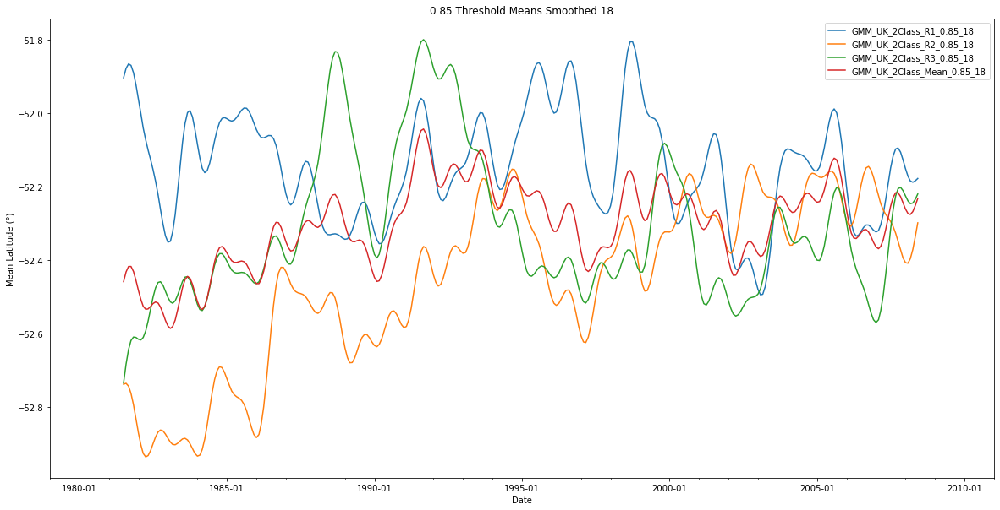

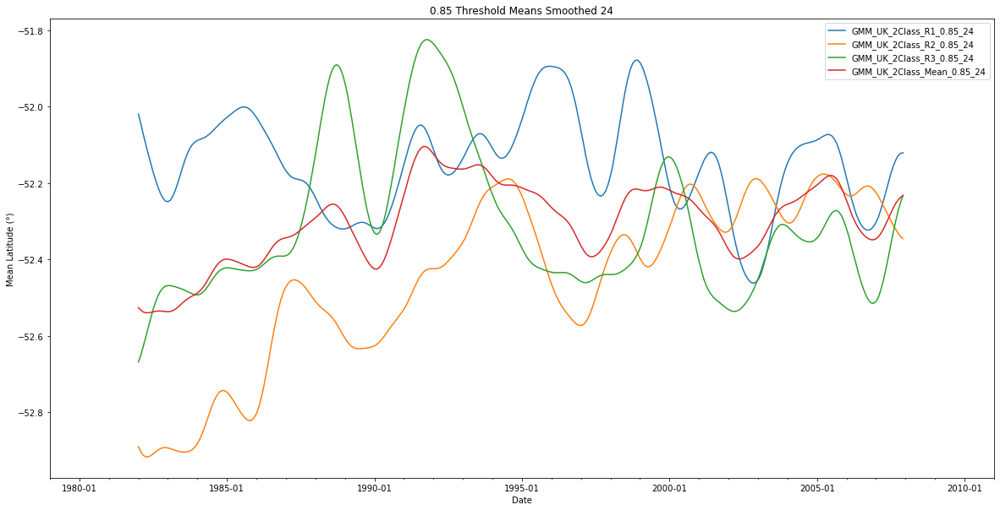

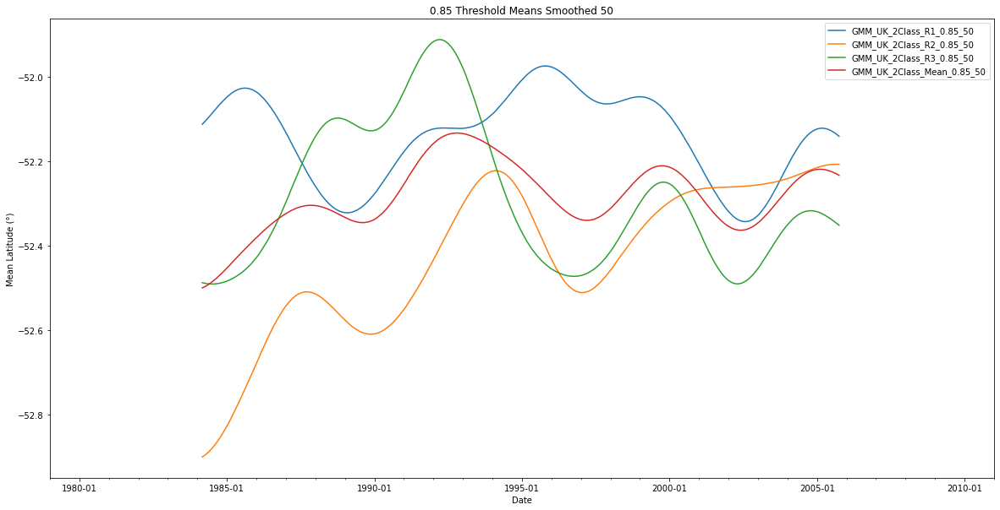

In [23]:
thresholdsLen = len(thresholds)
for i in range(len(GMModelNames)):
    currentLatMeans = LatMeanList[i]
    currentLatSmooth18 = smooth18Lat1980_09Arr[i]
    currentLatSmooth24 = smooth24Lat1980_09Arr[i]
    currentLatSmooth50 = smooth50Lat1980_09Arr[i]
    for j in range(thresholdsLen):
        latMeanPlot(currentLatMeans[j], 0, str(GMModelNames[i])+"_"+str(thresholds[j]), j)
        latMeanPlot(currentLatSmooth18[j], 18, str(GMModelNames[i])+"_"+str(thresholds[j])+"_18", j+thresholdsLen)
        latMeanPlot(currentLatSmooth24[j], 24, str(GMModelNames[i])+"_"+str(thresholds[j])+"_24", j+2*thresholdsLen)
        latMeanPlot(currentLatSmooth50[j], 50, str(GMModelNames[i])+"_"+str(thresholds[j])+"_50", j+3*thresholdsLen)
        
for i in range(thresholdsLen):
    latMeanPlot(currSmooth18MeanArr[i], 18, "GMM_UK_2Class_Mean_"+str(thresholds[i])+"_18", i+thresholdsLen)
    latMeanPlot(currSmooth24MeanArr[i], 24, "GMM_UK_2Class_Mean_"+str(thresholds[i])+"_24", i+2*thresholdsLen)
    latMeanPlot(currSmooth50MeanArr[i], 50, "GMM_UK_2Class_Mean_"+str(thresholds[i])+"_50", i+3*thresholdsLen)
        
for j in range(len(thresholds)):
    threshString = str(thresholds[j])
    plt.figure(j)
    plt.title(threshString+" Threshold Means")
    plt.figure(j+thresholdsLen)
    plt.title(threshString+" Threshold Means Smoothed 18")
    plt.figure(j+2*thresholdsLen)
    plt.title(threshString+" Threshold Means Smoothed 24")
    plt.figure(j+3*thresholdsLen)
    plt.title(threshString+" Threshold Means Smoothed 50")
plt.show()

<br>
<b>Mean Latitude Anomalies</b>

In [24]:
smoothAnomLatArrLen = len(meanLatDFList[0][thresholds[0]+"_Anom"])
smooth18AnomLat1980_09Arr = np.empty(shape=(0, 4, smoothAnomLatArrLen))
smooth24AnomLat1980_09Arr = np.empty(shape=(0, 4, smoothAnomLatArrLen))
smooth50AnomLat1980_09Arr = np.empty(shape=(0, 4, smoothAnomLatArrLen))

for i in range(len(GMModelNames)):
    currentAnomLatMeans = meanLatDFList[i]
    smooth18AnomTempArr = np.empty(shape=(0,smoothAnomLatArrLen))
    smooth24AnomTempArr = np.empty(shape=(0,smoothAnomLatArrLen))
    smooth50AnomTempArr = np.empty(shape=(0,smoothAnomLatArrLen))
    for j in range(len(thresholds)):
        currentAnomLatMeanSingle = currentAnomLatMeans[thresholds[j]+"_Anom"].values
        smooth18AnomTempArr = np.append(smooth18AnomTempArr, [butter_lowpass(currentAnomLatMeanSingle, 18)], axis=0)
        smooth24AnomTempArr = np.append(smooth24AnomTempArr, [butter_lowpass(currentAnomLatMeanSingle, 24)], axis=0)
        smooth50AnomTempArr = np.append(smooth50AnomTempArr, [butter_lowpass(currentAnomLatMeanSingle, 50)], axis=0)
        
    smooth18AnomLat1980_09Arr = np.append(smooth18AnomLat1980_09Arr, [smooth18AnomTempArr], axis=0)
    smooth24AnomLat1980_09Arr = np.append(smooth24AnomLat1980_09Arr, [smooth24AnomTempArr], axis=0)
    smooth50AnomLat1980_09Arr = np.append(smooth50AnomLat1980_09Arr, [smooth50AnomTempArr], axis=0) 
print("Smoothing calculated for SAM Index.")

Smoothing calculated for SAM Index.


In [25]:
thresholdsLen = len(thresholds)
currSmooth18AnomMeanArr = np.empty(shape=(0, smoothAnomLatArrLen))
currSmooth24AnomMeanArr = np.empty(shape=(0, smoothAnomLatArrLen))
currSmooth50AnomMeanArr = np.empty(shape=(0, smoothAnomLatArrLen))

for i in range(thresholdsLen):
    currSmooth18AnomMean = np.mean(smooth18AnomLat1980_09Arr[:,i], axis=0)
    currSmooth24AnomMean = np.mean(smooth24AnomLat1980_09Arr[:,i], axis=0)
    currSmooth50AnomMean = np.mean(smooth50AnomLat1980_09Arr[:,i], axis=0)
    
    currSmooth18AnomMeanArr = np.append(currSmooth18AnomMeanArr, [currSmooth18AnomMean], axis=0)
    currSmooth24AnomMeanArr = np.append(currSmooth24AnomMeanArr, [currSmooth24AnomMean], axis=0)
    currSmooth50AnomMeanArr = np.append(currSmooth50AnomMeanArr, [currSmooth50AnomMean], axis=0)
    
print("Smoothing Averages calculated.")

Smoothing Averages calculated.


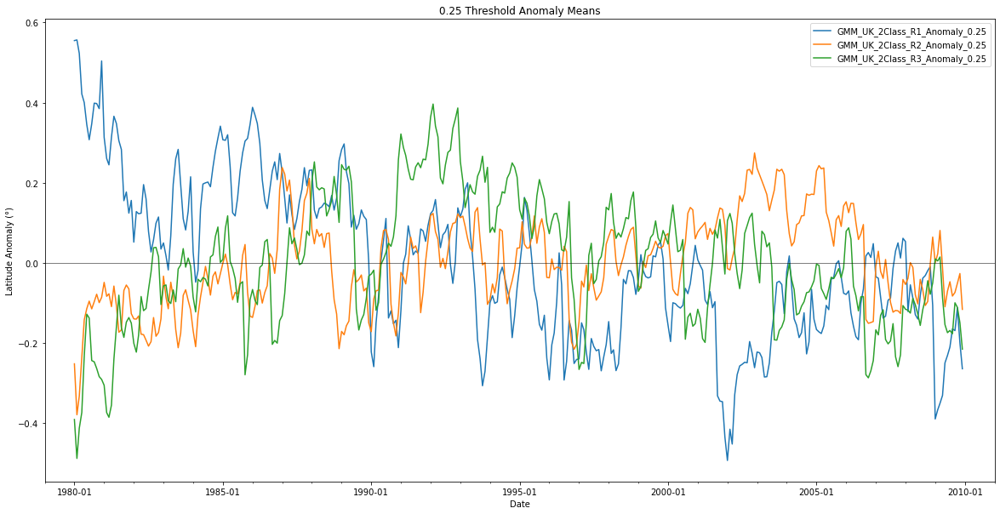

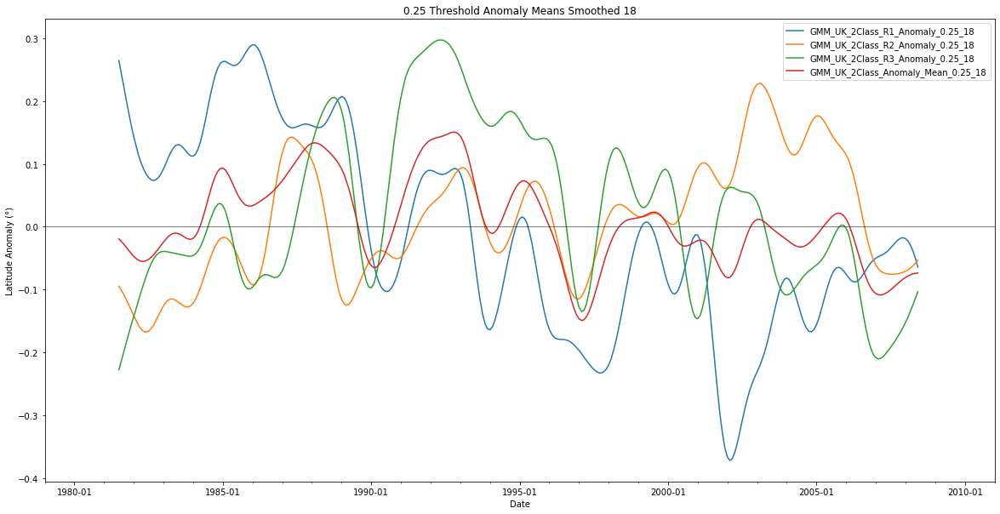

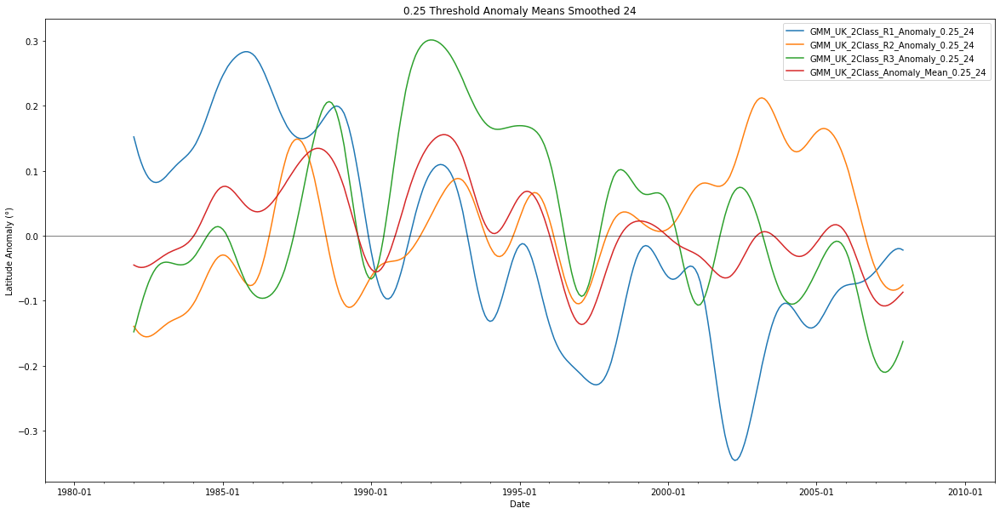

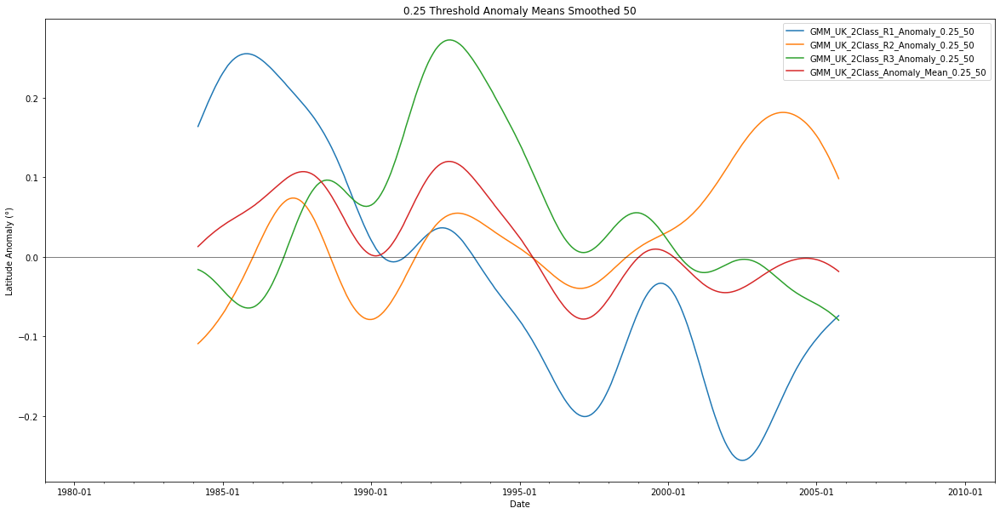

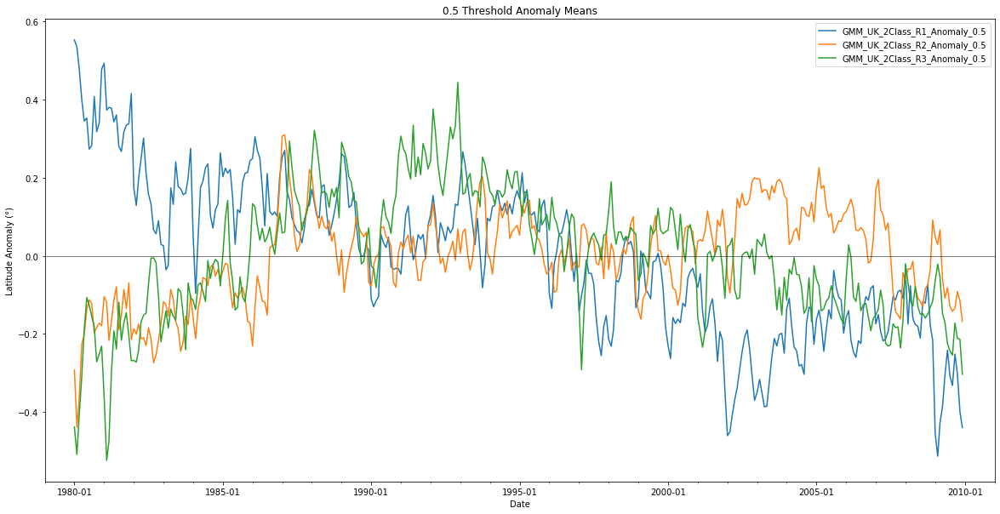

...

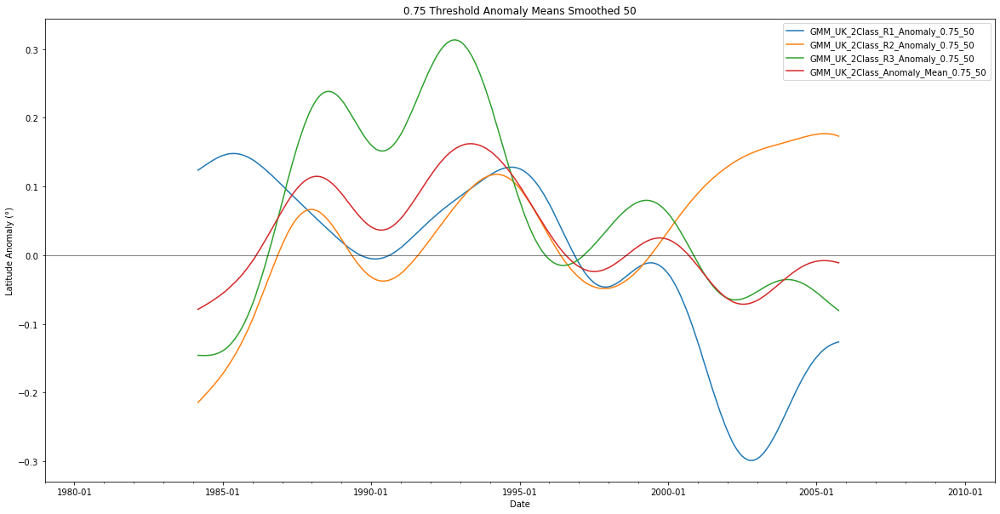

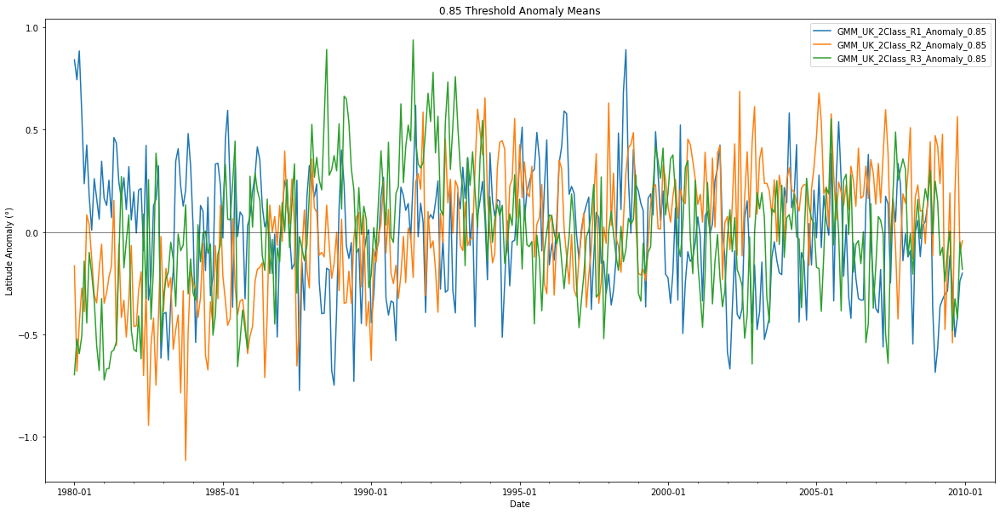

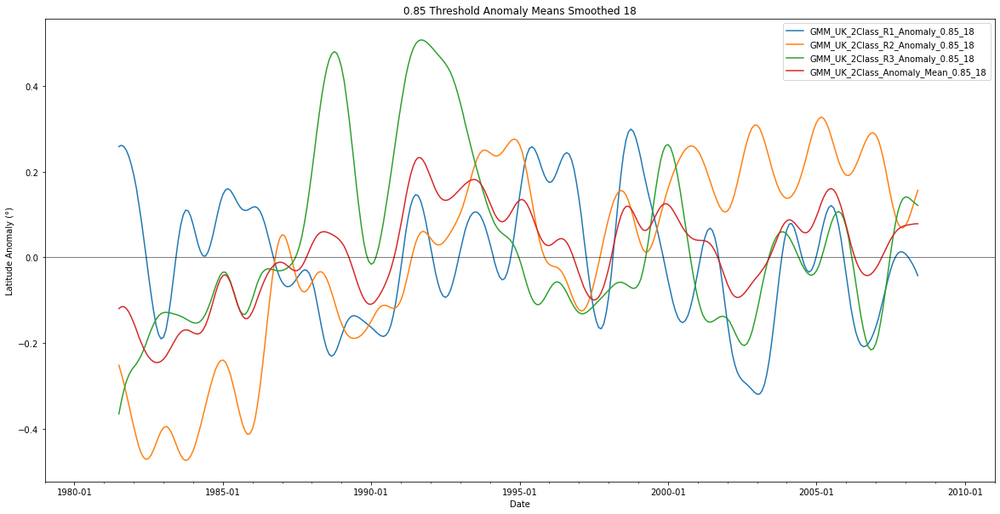

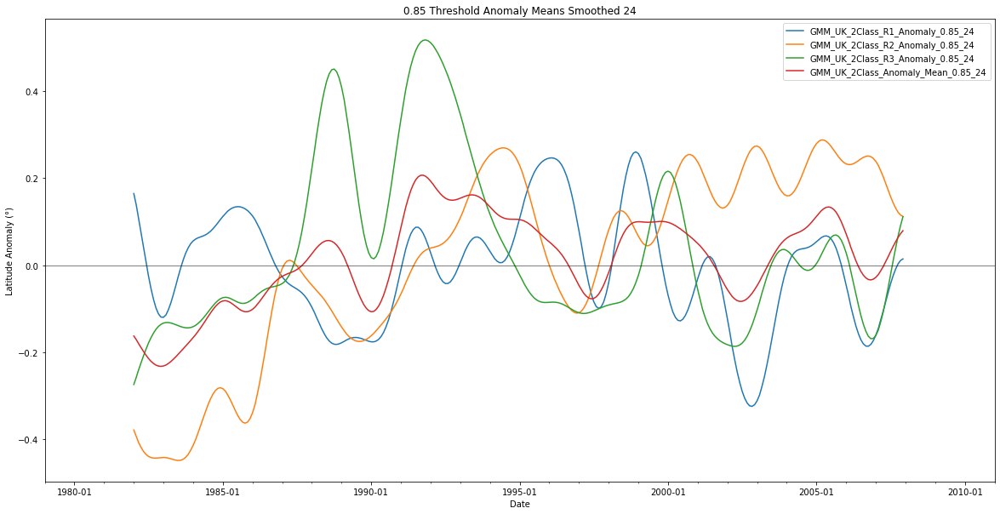

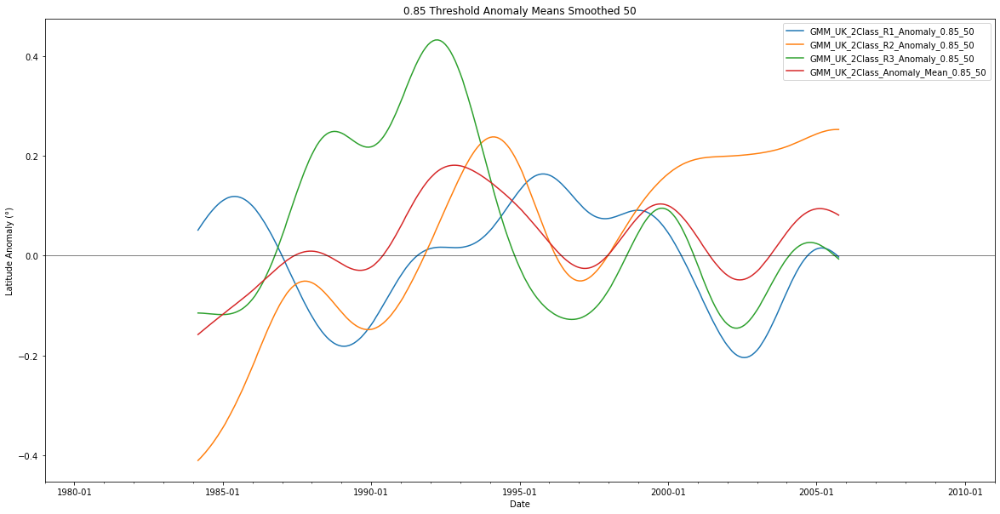

In [26]:
thresholdsLen = len(thresholds)
for i in range(len(GMModelNames)):
    currentAnomLatMeans = meanLatDFList[i]
    currentAnomLatSmooth18 = smooth18AnomLat1980_09Arr[i]
    currentAnomLatSmooth24 = smooth24AnomLat1980_09Arr[i]
    currentAnomLatSmooth50 = smooth50AnomLat1980_09Arr[i]
    for j in range(thresholdsLen):
        latMeanPlot(currentAnomLatMeans[thresholds[j]+"_Anom"], 0, str(GMModelNames[i])+"_Anomaly_"+str(thresholds[j]), j)
        latMeanPlot(currentAnomLatSmooth18[j], 18, str(GMModelNames[i])+"_Anomaly_"+str(thresholds[j])+"_18", j+thresholdsLen)
        latMeanPlot(currentAnomLatSmooth24[j], 24, str(GMModelNames[i])+"_Anomaly_"+str(thresholds[j])+"_24", j+2*thresholdsLen)
        latMeanPlot(currentAnomLatSmooth50[j], 50, str(GMModelNames[i])+"_Anomaly_"+str(thresholds[j])+"_50", j+3*thresholdsLen)
        
for i in range(thresholdsLen):
    latMeanPlot(currSmooth18AnomMeanArr[i], 18, "GMM_UK_2Class_Anomaly_Mean_"+str(thresholds[i])+"_18", i+thresholdsLen)
    latMeanPlot(currSmooth24AnomMeanArr[i], 24, "GMM_UK_2Class_Anomaly_Mean_"+str(thresholds[i])+"_24", i+2*thresholdsLen)
    latMeanPlot(currSmooth50AnomMeanArr[i], 50, "GMM_UK_2Class_Anomaly_Mean_"+str(thresholds[i])+"_50", i+3*thresholdsLen)
        
for j in range(len(thresholds)):
    threshString = str(thresholds[j])
    plt.figure(j)
    plt.axhline(0, color="Black", lw=0.5)
    plt.ylabel("Latitude Anomaly (°)")
    plt.title(threshString+" Threshold Anomaly Means")
    plt.figure(j+thresholdsLen)
    plt.axhline(0, color="Black", lw=0.5)
    plt.ylabel("Latitude Anomaly (°)")
    plt.title(threshString+" Threshold Anomaly Means Smoothed 18")
    plt.figure(j+2*thresholdsLen)
    plt.axhline(0, color="Black", lw=0.5)
    plt.ylabel("Latitude Anomaly (°)")
    plt.title(threshString+" Threshold Anomaly Means Smoothed 24")
    plt.figure(j+3*thresholdsLen)
    plt.axhline(0, color="Black", lw=0.5)
    plt.ylabel("Latitude Anomaly (°)")
    plt.title(threshString+" Threshold Anomaly Means Smoothed 50")
plt.show()

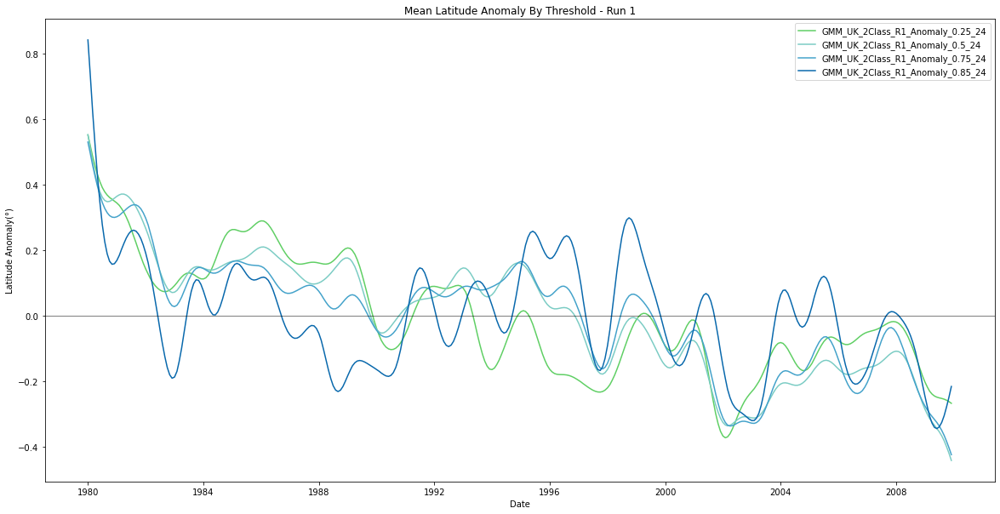

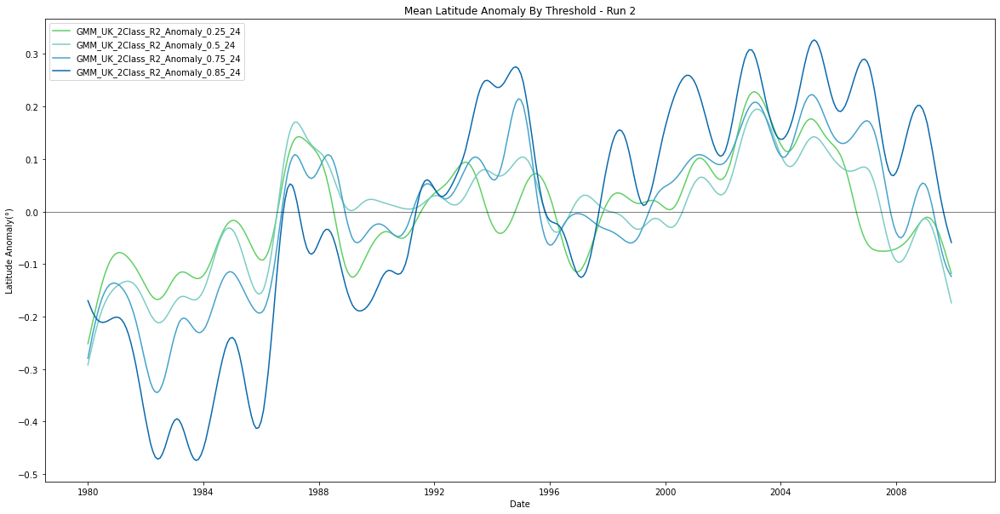

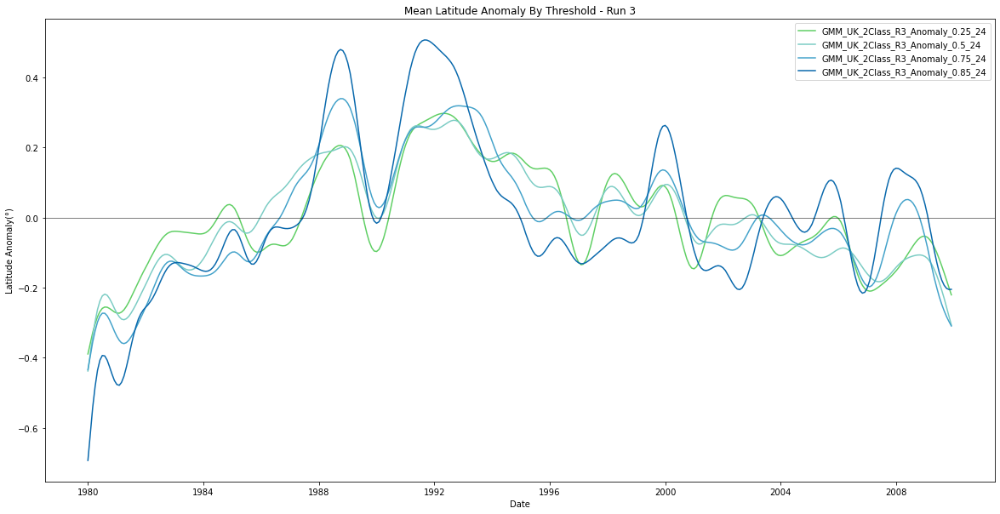

In [27]:
for i in range(len(GMModelNames)):
    plt.figure(i, figsize = (20,10))
    for j in range(4):
        plt.plot(timeAxis, smooth18AnomLat1980_09Arr[i][j], label=str(GMModelNames[i])+"_Anomaly_"+str(thresholds[j])+"_24", color=threshColor[j])
    plt.axhline(0, color="Black", lw=0.5)
    plt.xlabel("Date")
    plt.ylabel("Latitude Anomaly(°)")
    plt.title("Mean Latitude Anomaly By Threshold - Run "+str(i+1))
    plt.legend()
    plt.show()

<br>

### SAM vs Latitude Means

SAM vs Latitude Means


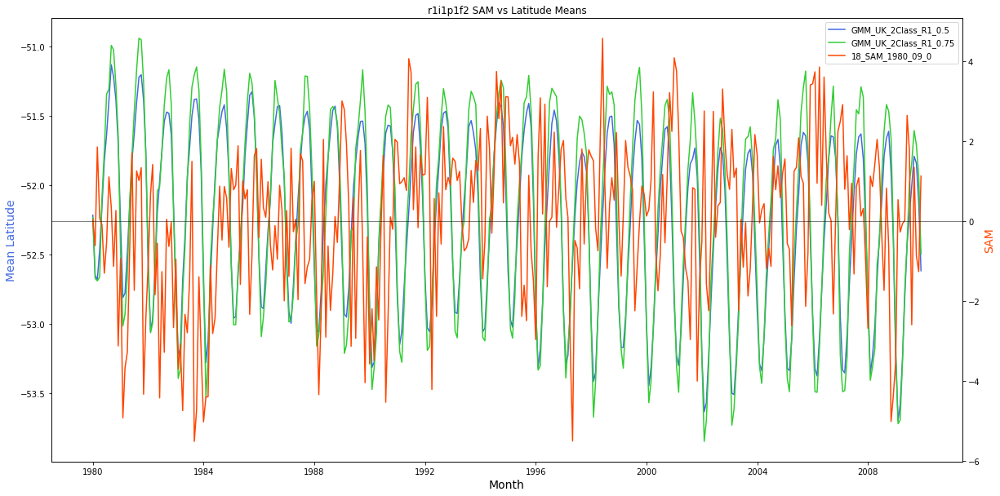

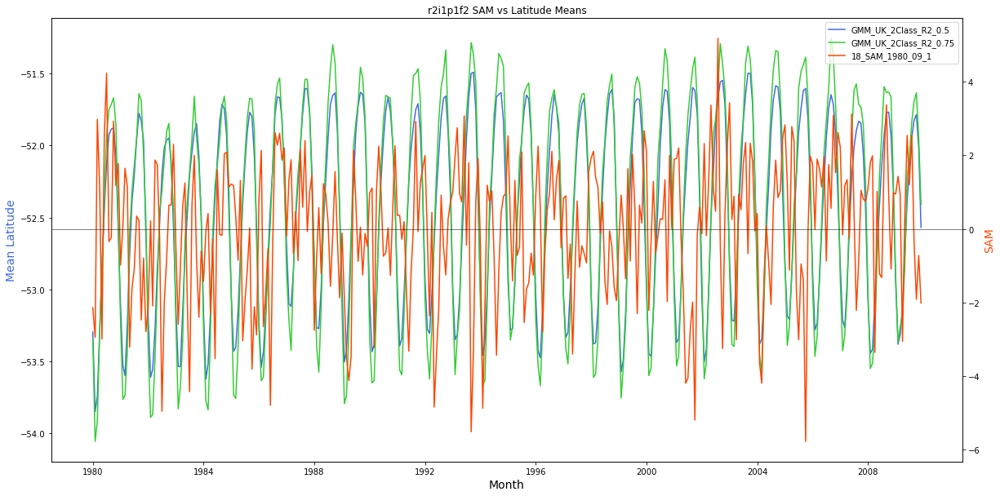

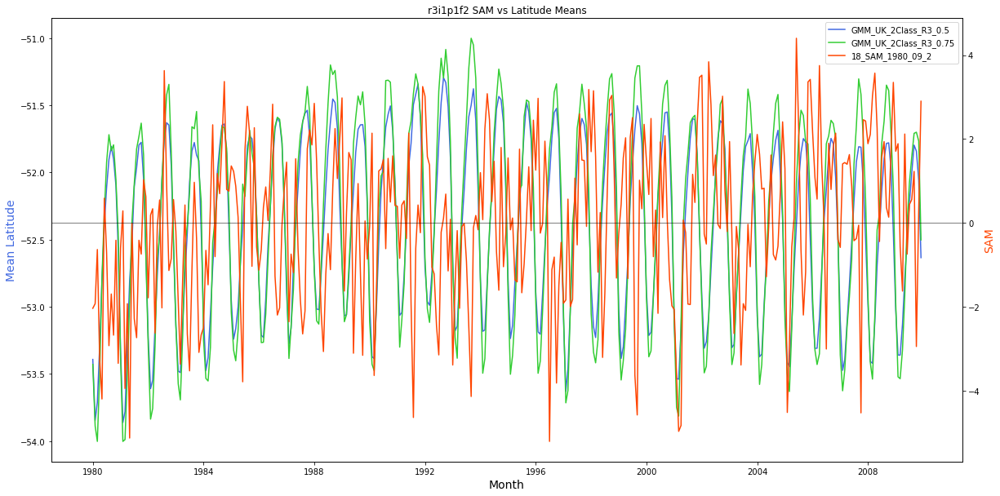

In [31]:
thresholdLook1 = 1
thresholdLook2 = 2
print("SAM vs Latitude Means")
for i in range(fileCount):
    fig,ax = plt.subplots()
    fig.set_figheight(10)
    fig.set_figwidth(20)
    ax.plot(timeAxis, LatMeanList[i][thresholdLook1], label=str(GMModelNames[i])+"_"+str(thresholds[thresholdLook1]), color="RoyalBlue")
    ax.plot(timeAxis, LatMeanList[i][thresholdLook2], label=str(GMModelNames[i])+"_"+str(thresholds[thresholdLook2]), color="LimeGreen")
    ax.title.set_text(str(approvedIds[i]+" SAM vs Latitude Means"))
    
    indexName = "SAM_Index_"+str(i)
    ax2 =ax.twinx()
    ax2.plot(SAM1980_09DF["time"], SAM1980_09DF[indexName], label="18_SAM_1980_09_"+str(i), color="OrangeRed")
    ax.set_xlabel("Month",fontsize=14)
    ax.set_ylabel("Mean Latitude",fontsize=14, color="RoyalBlue")
    ax2.set_ylabel("SAM",fontsize=14, color="OrangeRed")
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.axhline(0, color="Black", lw=0.5)
    ax2.legend(lines + lines2, labels + labels2)

Smoothed SAM vs Latitude Means


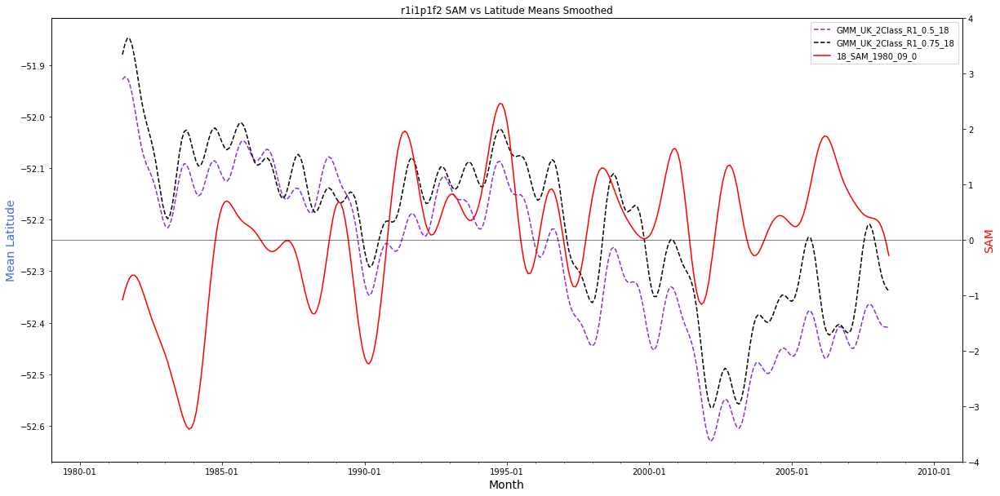

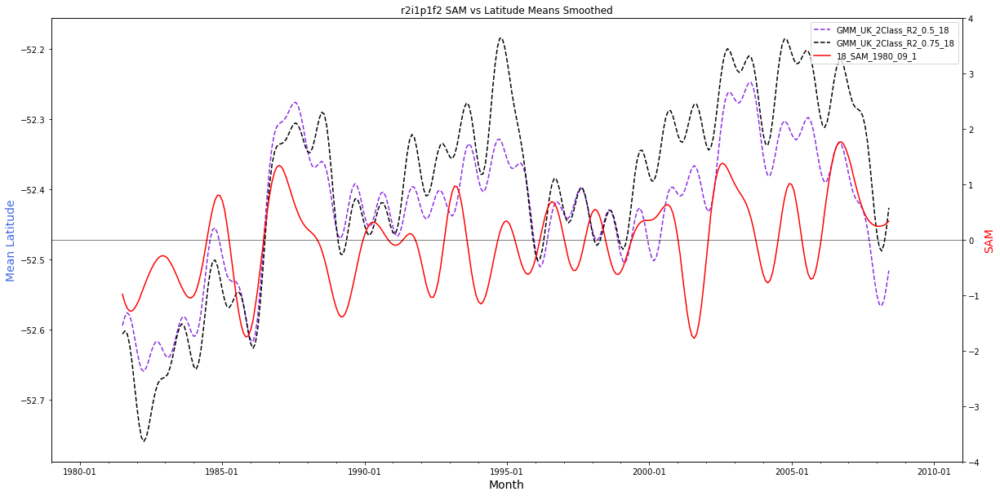

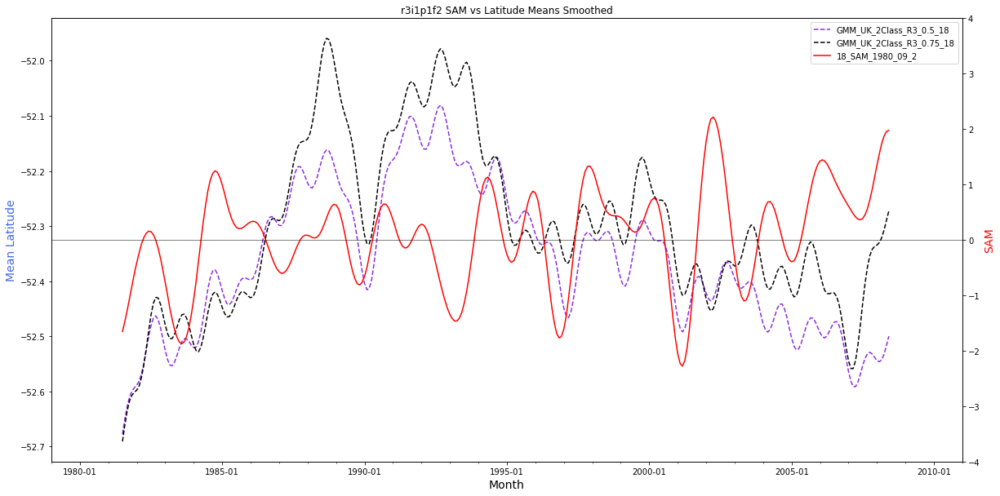

In [45]:
xLimStart, xLimStop = np.datetime64("1979-01", "Y"), np.datetime64("2011-01", "Y")
thresholdLook1 = 1
thresholdLook2 = 2
print("Smoothed SAM vs Latitude Means")
for i in range(fileCount):
    fig,ax = plt.subplots()
    fig.set_figheight(10)
    fig.set_figwidth(20)
    #ax.plot(timeAxis, LatMeanList[i][thresholdLook], label=str(GMModelNames[i])+"_"+str(thresholds[thresholdLook]), color="RoyalBlue")
    ax.plot(timeAxis[18:-18], smooth18Lat1980_09Arr[i][thresholdLook1][18:-18], label=str(GMModelNames[i])+"_"+str(thresholds[thresholdLook1])+"_18", color="BlueViolet", ls="--")
    ax.plot(timeAxis[18:-18], smooth18Lat1980_09Arr[i][thresholdLook2][18:-18], label=str(GMModelNames[i])+"_"+str(thresholds[thresholdLook2])+"_18", color="Black", ls="--")
    ax.title.set_text(str(approvedIds[i]+" SAM vs Latitude Means Smoothed"))
    
    ax2 =ax.twinx()
    ax2.plot(SAM1980_09DF["time"][18:-18], smooth18SAM1980_09Arr[i][18:-18], label="18_SAM_1980_09_"+str(i), color="Red")
    ax.set_xlabel("Month",fontsize=14)
    ax.set_ylabel("Mean Latitude",fontsize=14, color="RoyalBlue")
    ax2.set_ylabel("SAM",fontsize=14, color="Red")
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.axhline(0, color="Black", lw=0.5)
    ax2.legend(lines + lines2, labels + labels2)
    ax2.set(ylim=[-4, 4])
    
    ax.xaxis.set_major_locator(mdates.YearLocator(5))
    ax.xaxis.set_minor_locator(mdates.YearLocator(1))
    ax.xaxis.set_major_formatter(DateFormatter("%Y-%m"))
    ax.set(xlim=[xLimStart, xLimStop])

plt.show()

SAM vs Latitude Mean Anomalies


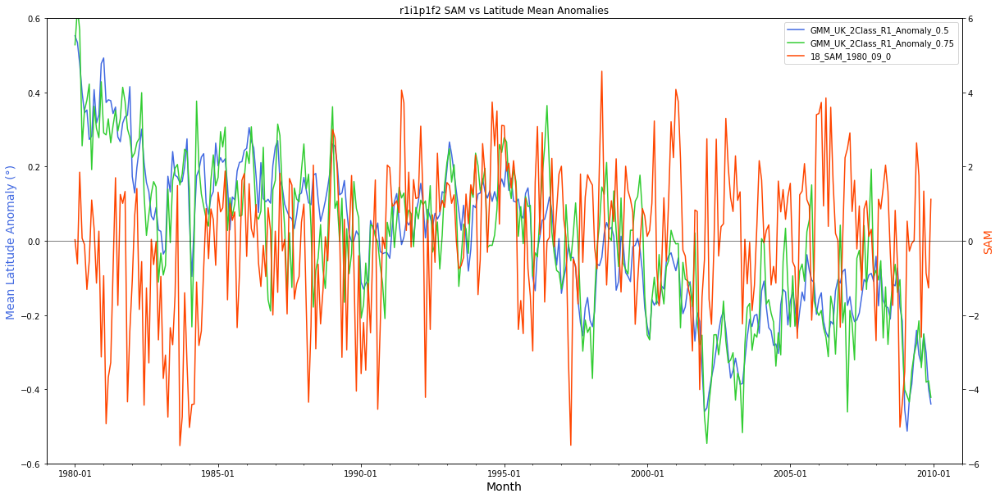

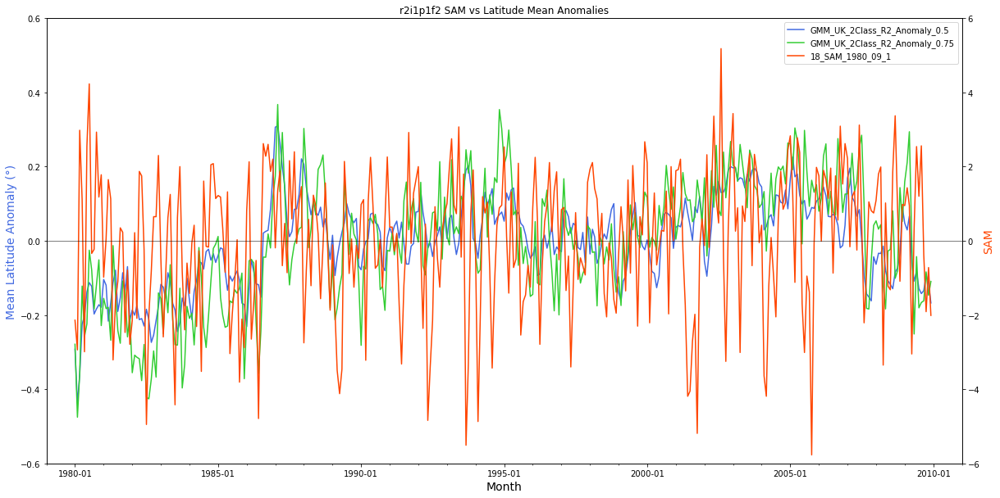

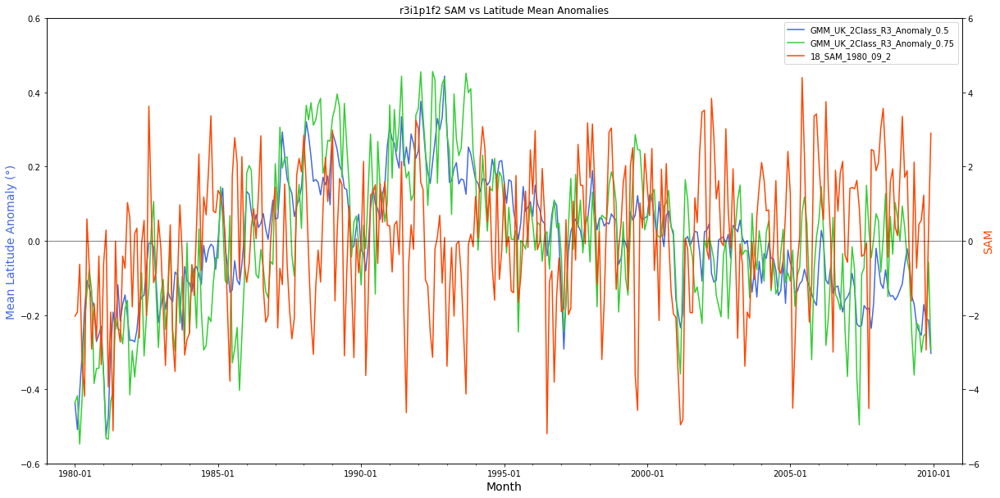

In [40]:
xLimStart, xLimStop = np.datetime64("1979-01", "Y"), np.datetime64("2011-01", "Y")
thresholdLook1 = 1
thresholdLook2 = 2
print("SAM vs Latitude Mean Anomalies")
for i in range(fileCount):
    fig,ax = plt.subplots()
    fig.set_figheight(10)
    fig.set_figwidth(20)
    ax.plot(timeAxis, meanLatDFList[i][thresholds[thresholdLook1]+"_Anom"], label=str(GMModelNames[i])+"_Anomaly_"+str(thresholds[thresholdLook1]), color="RoyalBlue")
    ax.plot(timeAxis, meanLatDFList[i][thresholds[thresholdLook2]+"_Anom"], label=str(GMModelNames[i])+"_Anomaly_"+str(thresholds[thresholdLook2]), color="LimeGreen")
    ax.set(ylim =[-0.6,0.6])
    ax.title.set_text(str(approvedIds[i]+" SAM vs Latitude Mean Anomalies"))
    
    indexName = "SAM_Index_"+str(i)
    ax2 =ax.twinx()
    ax2.plot(SAM1980_09DF["time"], SAM1980_09DF[indexName], label="18_SAM_1980_09_"+str(i), color="OrangeRed")
    ax.set_xlabel("Month", fontsize=14)
    ax.set_ylabel("Mean Latitude Anomaly (°)",fontsize=14, color="RoyalBlue")
    ax2.set_ylabel("SAM",fontsize=14, color="OrangeRed")
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.axhline(0, color="Black", lw=0.5)
    ax2.legend(lines + lines2, labels + labels2)
    ax2.set(ylim=[-6, 6])
    
    ax.xaxis.set_major_locator(mdates.YearLocator(5))
    ax.xaxis.set_minor_locator(mdates.YearLocator(1))
    ax.xaxis.set_major_formatter(DateFormatter("%Y-%m"))
    ax.set(xlim=[xLimStart, xLimStop])

Smoothed SAM vs Latitude Mean Anomalies


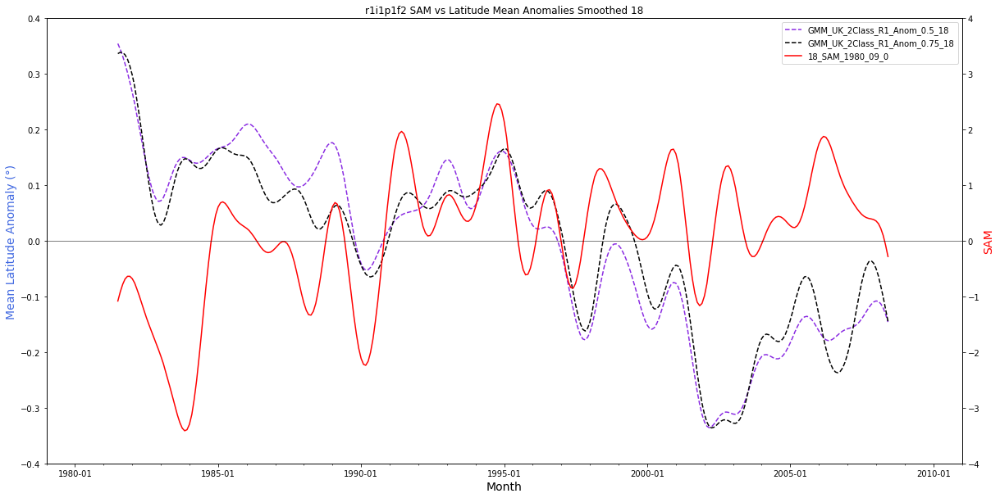

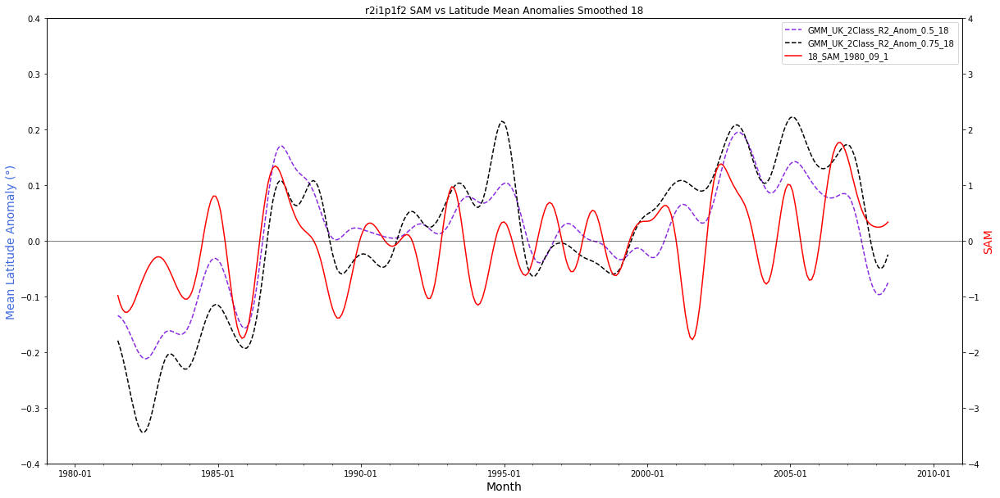

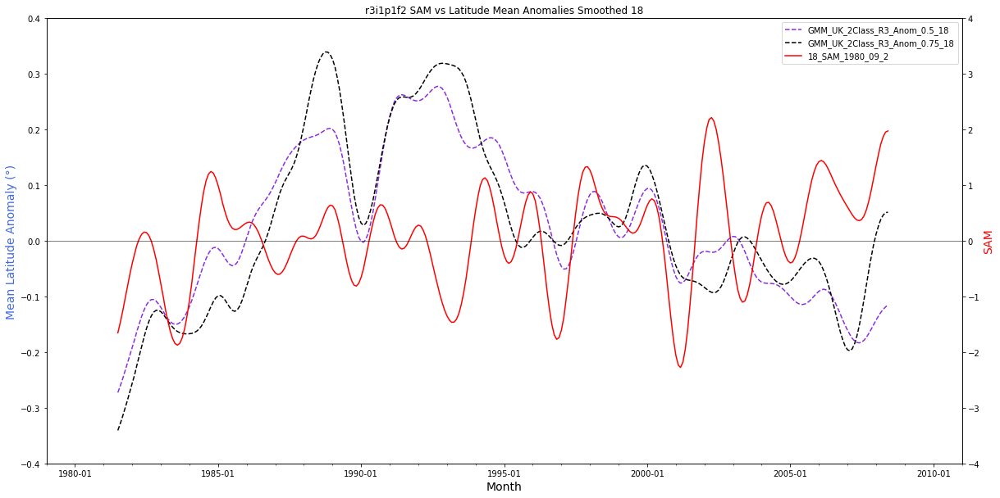

In [50]:
xLimStart, xLimStop = np.datetime64("1979-01", "Y"), np.datetime64("2011-01", "Y")
thresholdLook1 = 1
thresholdLook2 = 2
print("Smoothed SAM vs Latitude Mean Anomalies")
for i in range(fileCount):
    fig,ax = plt.subplots()
    fig.set_figheight(10)
    fig.set_figwidth(20)
    #ax.plot(timeAxis, LatMeanList[i][thresholdLook], label=str(GMModelNames[i])+"_"+str(thresholds[thresholdLook]), color="RoyalBlue")
    ax.plot(timeAxis[18:-18], smooth18AnomLat1980_09Arr[i][thresholdLook1][18:-18], label=str(GMModelNames[i])+"_Anom_"+str(thresholds[thresholdLook1])+"_18", color="BlueViolet", ls="--")
    ax.plot(timeAxis[18:-18], smooth18AnomLat1980_09Arr[i][thresholdLook2][18:-18], label=str(GMModelNames[i])+"_Anom_"+str(thresholds[thresholdLook2])+"_18", color="Black", ls="--")
    ax.set(ylim=[-0.4, 0.4])
    ax.title.set_text(str(approvedIds[i]+" SAM vs Latitude Mean Anomalies Smoothed 18"))
    
    ax2 =ax.twinx()
    ax2.plot(SAM1980_09DF["time"][18:-18], smooth18SAM1980_09Arr[i][18:-18], label="18_SAM_1980_09_"+str(i), color="Red")
    ax.set_xlabel("Month",fontsize=14)
    ax.set_ylabel("Mean Latitude Anomaly (°)",fontsize=14, color="RoyalBlue")
    ax2.set_ylabel("SAM",fontsize=14, color="Red")
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.axhline(0, color="Black", lw=0.5)
    ax2.legend(lines + lines2, labels + labels2)
    ax2.set(ylim=[-4, 4])
    
    ax.xaxis.set_major_locator(mdates.YearLocator(5))
    ax.xaxis.set_minor_locator(mdates.YearLocator(1))
    ax.xaxis.set_major_formatter(DateFormatter("%Y-%m"))
    ax.set(xlim=[xLimStart, xLimStop])

plt.show()

Smoothed SAM vs Latitude Mean Anomalies


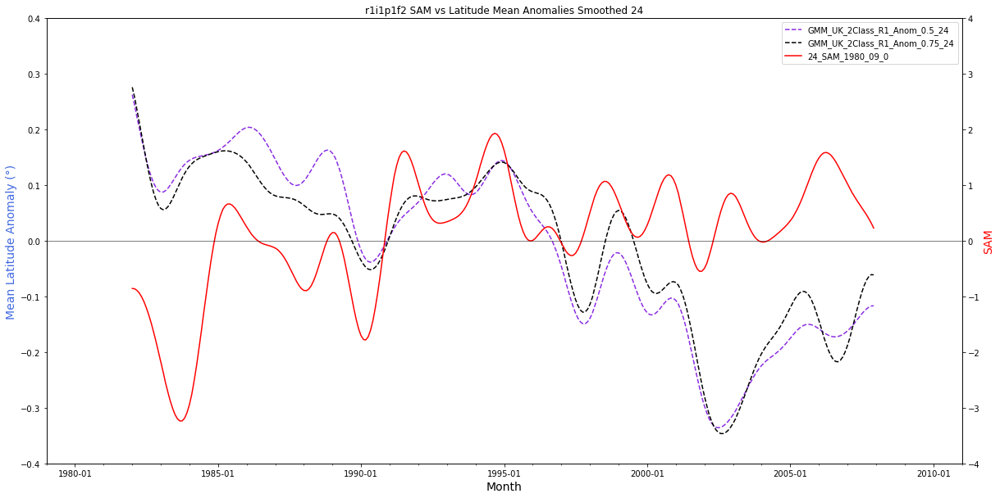

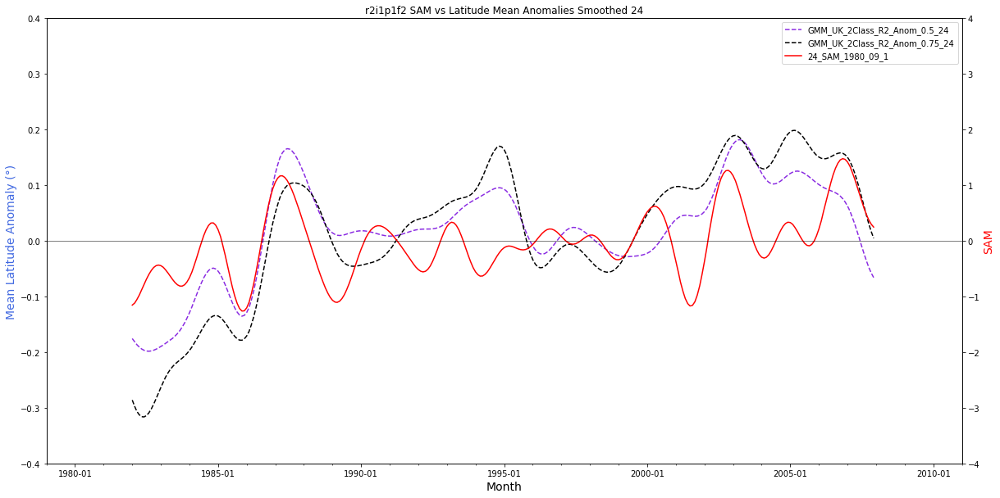

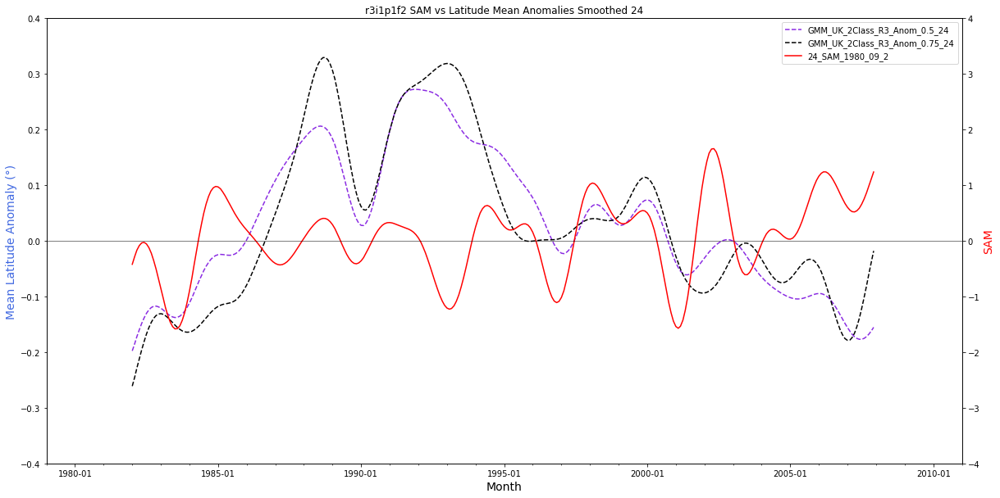

In [51]:
xLimStart, xLimStop = np.datetime64("1979-01", "Y"), np.datetime64("2011-01", "Y")
thresholdLook1 = 1
thresholdLook2 = 2
print("Smoothed SAM vs Latitude Mean Anomalies")
for i in range(fileCount):
    fig,ax = plt.subplots()
    fig.set_figheight(10)
    fig.set_figwidth(20)
    #ax.plot(timeAxis, LatMeanList[i][thresholdLook], label=str(GMModelNames[i])+"_"+str(thresholds[thresholdLook]), color="RoyalBlue")
    ax.plot(timeAxis[24:-24], smooth24AnomLat1980_09Arr[i][thresholdLook1][24:-24], label=str(GMModelNames[i])+"_Anom_"+str(thresholds[thresholdLook1])+"_24", color="BlueViolet", ls="--")
    ax.plot(timeAxis[24:-24], smooth24AnomLat1980_09Arr[i][thresholdLook2][24:-24], label=str(GMModelNames[i])+"_Anom_"+str(thresholds[thresholdLook2])+"_24", color="Black", ls="--")
    ax.set(ylim=[-0.4, 0.4])
    ax.title.set_text(str(approvedIds[i]+" SAM vs Latitude Mean Anomalies Smoothed 24"))
    
    ax2 =ax.twinx()
    ax2.plot(SAM1980_09DF["time"][24:-24], smooth24SAM1980_09Arr[i][24:-24], label="24_SAM_1980_09_"+str(i), color="Red")
    ax.set_xlabel("Month",fontsize=14)
    ax.set_ylabel("Mean Latitude Anomaly (°)",fontsize=14, color="RoyalBlue")
    ax2.set_ylabel("SAM",fontsize=14, color="Red")
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.axhline(0, color="Black", lw=0.5)
    ax2.legend(lines + lines2, labels + labels2)
    ax2.set(ylim=[-4, 4])
    
    ax.xaxis.set_major_locator(mdates.YearLocator(5))
    ax.xaxis.set_minor_locator(mdates.YearLocator(1))
    ax.xaxis.set_major_formatter(DateFormatter("%Y-%m"))
    ax.set(xlim=[xLimStart, xLimStop])

plt.show()

In [67]:
print("Raw")
for i in range(3):
    print(str(GMModelNames[i]))
    slope, intercept, r_value, p_value, std_err = stats.linregress(SAM1980_09DF["SAM_Index_"+str(i)][24:-24], meanLatDFList[i][thresholds[thresholdLook1]][24:-24])
    print("Slope: "+str(slope) + "\tIntercept: "+str(intercept))
    print("R value: "+str(r_value) + "\tP value: "+str(p_value))
    print("Std error: "+str(std_err))
    print("------------------")

print("\nSmoothed")
for i in range(3):
    print(str(GMModelNames[i]))
    slope, intercept, r_value, p_value, std_err = stats.linregress(smooth24SAM1980_09Arr[i][24:-24],smooth24AnomLat1980_09Arr[i][thresholdLook1][24:-24])
    print("Slope: "+str(slope) + "\tIntercept: "+str(intercept))
    print("R value: "+str(r_value) + "\tP value: "+str(p_value))
    print("Std error: "+str(std_err))
    print("------------------")

Raw
GMM_UK_2Class_R1
Slope: -0.03045961101440314	Intercept: -52.272785926760385
R value: -0.09610293553651836	P value: 0.09014616088019227
Std error: 0.017918102252487952
------------------
GMM_UK_2Class_R2
Slope: -0.007215539469021029	Intercept: -52.42432614179428
R value: -0.02147321664508719	P value: 0.7055689309168767
Std error: 0.019080541885957952
------------------
GMM_UK_2Class_R3
Slope: -0.0002548983323603135	Intercept: -52.35539197371515
R value: -0.0007691708970027372	P value: 0.9892035662115686
Std error: 0.018821887584745633
------------------

Smoothed
GMM_UK_2Class_R1
Slope: -0.03839202635750155	Intercept: -0.004666022446858336
R value: -0.2646519661973542	P value: 2.1296171481319646e-06
Std error: 0.007945423359070702
------------------
GMM_UK_2Class_R2
Slope: 0.07683384924370115	Intercept: 0.02188572393645027
R value: 0.5266375516229863	P value: 1.1613222087411594e-23
Std error: 0.007044088324740096
------------------
GMM_UK_2Class_R3
Slope: -0.01178924660382901	Interc

### End of Notebook